<a href="https://colab.research.google.com/github/sasidharvarada/Construction-Plan/blob/dev--pravallika/5_Nodes_SDS_Calibration.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Basic

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from scipy.stats import pearsonr
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
!pip install gpx-converter
from gpx_converter import Converter
from tabulate import tabulate
from functools import reduce


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.6/42.6 kB 2.9 MB/s eta 0:00:00


In [4]:
import pandas as pd

def remove_timezone(dt):
    return dt.replace(tzinfo=None)

def renaming_columns_avg(df1, avg, node_type='Outside'):
    df1['created_at'] = df1['created_at'].apply(remove_timezone)
    df1['Date'] = df1['created_at'].dt.date
    df1['Time'] = df1['created_at'].dt.time
    df1['created_at'] = pd.to_datetime(df1['created_at'])
    df1.set_index("created_at", inplace=True)
    # Resample, calculating the mean for numeric columns
    df1_resampled = df1.select_dtypes(include=['float64', 'int64']).resample(avg, label='right', closed='right').mean().round(3)

    # Drop NaN columns
    df1_resampled = df1_resampled.dropna(axis=1, how='all')
    # Drop unnecessary columns
    df1_resampled = df1_resampled.drop(['entry_id'], axis=1)

    # Convert all columns except 'created_at' to numeric
    # numeric_cols = df1_resampled.columns.drop('Date').drop('Time')
    # df1_resampled[numeric_cols] = df1_resampled[numeric_cols].apply(pd.to_numeric, errors='coerce')

    if node_type == 'Bus':
        df1_resampled = df1_resampled.rename(columns={'field1': 'PM2.5', 'field2': 'PM10', 'field3': 'Temperature', 'field4': 'Rh'})
        df1_resampled = df1_resampled[df1_resampled['PM10'] < 1000]
    elif node_type == 'Inside':
        df1_resampled = df1_resampled.rename(columns={'field1': 'Temperature', 'field2': 'RH', 'field3': 'PM2.5', 'field4': 'PM10',
                                  'field5': 'CO', 'field6': 'NO2', 'field7': 'NH3'})
    elif node_type == 'Airveda':
        df1_resampled = df1_resampled.rename(columns={'field1': 'AQI', 'field2': 'PM10', 'field3': 'PM2.5', 'field4': 'CO', 'field5': 'NOX'})

    return df1_resampled






# Handling raw data

In [5]:
# Load data
bn1 = pd.read_csv('/content/Faculty_quarters.csv', parse_dates=['created_at'])
bn2 = pd.read_csv('/content/Football_ground.csv', parse_dates=['created_at'])
bn3 = pd.read_csv('/content/PH_4.csv', parse_dates=['created_at'])
bn4 = pd.read_csv('/content/Pump_house.csv', parse_dates=['created_at'])
bn5 = pd.read_csv('/content/T_hub.csv', parse_dates=['created_at'])


In [6]:
bn1


,created_at,entry_id,field1,field2,PM2.5,PM10,field5,field6,field7
0,2024-09-10 22:00:16+05:30,4720247,28.60,78.52,3.4,11.9,53.17,NaN,NaN
1,2024-09-10 22:00:32+05:30,4720248,28.61,78.56,3.5,11.2,53.50,NaN,NaN
2,2024-09-10 22:01:18+05:30,4720249,28.55,78.80,3.2,11.1,53.17,NaN,NaN
3,2024-09-10 22:01:34+05:30,4720250,28.58,78.66,3.2,12.5,53.17,NaN,NaN
4,2024-09-10 22:02:18+05:30,4720251,28.55,78.51,3.3,12.4,53.33,NaN,NaN
...,...,...,...,...,...,...,...,...,...
4408,2024-09-12 11:57:01+05:30,4724655,28.93,72.37,9.2,13.7,49.95,NaN,NaN
4409,2024-09-12 11:58:00+05:30,4724656,28.90,72.47,8.7,12.6,49.79,NaN,NaN
4410,2024-09-12 11:58:44+05:30,4724657,28.87,72.52,9.1,13.4,49.95,NaN,NaN
4411,2024-09-12 11:58:59+05:30,4724658,28.88,72.52,9.8,15.4,50.27,NaN,NaN


In [7]:
bn2

,created_at,entry_id,field1,field2,PM2.5,PM10,field5,field6,field7
0,2024-09-10 22:00:25+05:30,3336021,28.61,82.84,3.7,10.8,49.31,NaN,NaN
1,2024-09-10 22:00:40+05:30,3336022,28.63,82.91,3.6,10.6,49.63,NaN,NaN
2,2024-09-10 22:01:26+05:30,3336023,28.71,82.46,3.7,11.4,78.63,NaN,NaN
3,2024-09-10 22:01:42+05:30,3336024,28.87,84.50,3.5,9.9,72.51,NaN,NaN
4,2024-09-10 22:02:26+05:30,3336025,28.85,82.08,3.8,10.2,49.47,NaN,NaN
...,...,...,...,...,...,...,...,...,...
4406,2024-09-12 11:57:32+05:30,3340427,28.76,76.94,10.8,16.2,52.37,NaN,NaN
4407,2024-09-12 11:57:47+05:30,3340428,28.76,76.89,10.8,16.4,53.17,NaN,NaN
4408,2024-09-12 11:58:47+05:30,3340429,28.81,76.81,10.6,16.0,52.53,NaN,NaN
4409,2024-09-12 11:59:33+05:30,3340430,28.73,76.92,10.9,16.9,51.88,NaN,NaN


In [8]:
bn3


,created_at,entry_id,field1,field2,PM2.5,PM10,field5
0,2024-09-10 22:00:14+05:30,936062,29.18,73.29,876.4,NaN,0.48
1,2024-09-10 22:00:59+05:30,936063,29.15,73.26,865.7,NaN,1.13
2,2024-09-10 22:01:14+05:30,936064,29.17,73.18,876.6,NaN,0.32
3,2024-09-10 22:01:58+05:30,936065,29.21,73.09,907.4,NaN,0.81
4,2024-09-10 22:02:14+05:30,936066,29.23,72.99,889.0,NaN,0.48
...,...,...,...,...,...,...,...
4398,2024-09-12 11:57:24+05:30,940460,29.05,68.85,11.1,14.6,0.48
4399,2024-09-12 11:57:39+05:30,940461,29.05,68.75,10.8,14.7,0.00
4400,2024-09-12 11:58:24+05:30,940462,29.05,68.85,11.1,15.3,3.38
4401,2024-09-12 11:58:39+05:30,940463,29.06,68.74,12.2,17.7,0.97


In [9]:
bn4

,created_at,entry_id,field1,field2,PM2.5,PM10,field5,field6,field7
0,2024-09-10 22:00:10+05:30,2731305,27.33,86.90,3.5,11.9,0.0,NaN,NaN
1,2024-09-10 22:00:25+05:30,2731306,27.39,86.44,4.0,15.4,0.0,NaN,NaN
2,2024-09-10 22:00:55+05:30,2731307,27.56,85.58,4.0,12.7,0.0,NaN,NaN
3,2024-09-10 22:01:11+05:30,2731308,27.62,85.19,3.2,8.9,0.0,NaN,NaN
4,2024-09-10 22:01:26+05:30,2731309,27.68,84.98,3.2,8.6,0.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...
6220,2024-09-12 11:58:39+05:30,2737525,29.11,73.52,9.0,13.9,0.0,NaN,NaN
6221,2024-09-12 11:58:54+05:30,2737526,29.15,73.44,10.0,15.6,0.0,NaN,NaN
6222,2024-09-12 11:59:10+05:30,2737527,29.19,73.33,10.0,16.6,0.0,NaN,NaN
6223,2024-09-12 11:59:40+05:30,2737528,29.19,73.25,9.4,15.0,0.0,NaN,NaN


In [10]:
bn5

,created_at,entry_id,field1,field2,PM2.5,PM10,field5,field6,field7
0,2024-09-10 22:00:33+05:30,4316061,28.49,76.31,2.3,9.4,59.30,NaN,NaN
1,2024-09-10 22:00:48+05:30,4316062,28.47,76.37,2.0,7.4,58.81,NaN,NaN
2,2024-09-10 22:01:33+05:30,4316063,28.43,76.51,2.3,8.0,60.26,NaN,NaN
3,2024-09-10 22:01:49+05:30,4316064,28.40,76.50,2.4,6.2,77.67,NaN,NaN
4,2024-09-10 22:02:34+05:30,4316065,28.49,77.07,2.5,5.6,62.68,NaN,NaN
...,...,...,...,...,...,...,...,...,...
4427,2024-09-12 11:57:47+05:30,4320488,28.88,70.23,5.2,9.0,58.81,NaN,NaN
4428,2024-09-12 11:58:31+05:30,4320489,28.88,70.22,4.8,7.7,58.81,NaN,NaN
4429,2024-09-12 11:58:46+05:30,4320490,28.89,70.25,5.1,7.7,58.65,NaN,NaN
4430,2024-09-12 11:59:31+05:30,4320491,28.88,70.23,5.2,9.6,58.49,NaN,NaN


In [11]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=bn1.index, y=bn1['PM10'], name='bn1'))
fig.add_trace(go.Scatter(x=bn2.index, y=bn2['PM10'], name='bn2'))
fig.add_trace(go.Scatter(x=bn3.index, y=bn3['PM10'], name='bn3'))
fig.add_trace(go.Scatter(x=bn4.index, y=bn4['PM10'], name='bn4'))
fig.add_trace(go.Scatter(x=bn5.index, y=bn5['PM10'], name='bn5'))
fig.update_layout(title='Raw data PM10')
fig.update_xaxes()
fig.show()


In [12]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=bn1.index, y=bn1['PM2.5'], name='bn1'))
fig.add_trace(go.Scatter(x=bn2.index, y=bn2['PM2.5'], name='bn2'))
fig.add_trace(go.Scatter(x=bn3.index, y=bn3['PM2.5'], name='bn3'))
fig.add_trace(go.Scatter(x=bn4.index, y=bn4['PM2.5'], name='bn4'))
fig.add_trace(go.Scatter(x=bn5.index, y=bn5['PM2.5'], name='bn5'))
fig.update_layout(title='Raw data PM2.5')
fig.update_xaxes()
fig.show()

# Removing Outliers

In [13]:
# Initialize empty DataFrames for further processing
bn_1 = pd.DataFrame()
bn_2 = pd.DataFrame()
bn_3 = pd.DataFrame()
bn_4 = pd.DataFrame()
bn_5 = pd.DataFrame()

In [14]:
# Assign names to DataFrames
bn1.name = 'bn1'
bn2.name = 'bn2'
bn3.name = 'bn3'
bn4.name = 'bn4'
bn5.name = 'bn5'

In [15]:

def outlier_removal(df, column_name, max_col_val, verbose=True, node_type='Outside'):


# calculate summary statistics

#     lc3_mean, lc3_std = np.mean(df[column_name]), np.std(df[column_name])

#     # identify outliers
#     cut_off = lc3_std * 3
#     lower, upper = lc3_mean - cut_off, lc3_mean + cut_off
#     #identifying outliers
#     outliers = [x for x in df[column_name] if x < lower or x > upper]
#     # remove outliers
#     outliers_removed = [x for x in df[column_name] if x > lower and x < upper]

#     uu_1  = df[df[column_name] > lower]
#     new_df = uu_1[uu_1[column_name] < upper]
    df = df[df[column_name]< max_col_val]
    # if Node_type == 'Outside':
    #     df = df[df['RH']<85]
    q25, q75 = np.percentile(df[column_name], 25), np.percentile(df[column_name], 75)
    iqr = q75 - q25
    # calculate the outlier cutoff
    cut_off = iqr * 1.5
    lower, upper = q25 - cut_off, q75 + cut_off

    #identifying outliers
    outliers = [x for x in df[column_name] if x < lower or x > upper]

    # remove outliers
    outliers_removed = [x for x in df[column_name] if x > lower and x < upper]
    uu_1  = df[df[column_name] > lower]
    new_df = uu_1[uu_1[column_name] < upper]

    if verbose == True:
        print("cut off: ", cut_off)
        print("lower and upper boundaries: ", round(lower, 2), round(upper,2))
        #print("mean and standard deviation: ", lc3_mean, lc3_std)
        print('Identified outliers: %d' % len(outliers))
        print('Non-outlier observations: %d' % len(outliers_removed))
        print("q25,q75 ", q25, q75)

    return cut_off,round(lower, 2), round(upper,2), q25, q75, len(outliers),len(outliers_removed),new_df


In [16]:
dfs = [bn1, bn2, bn3, bn4, bn5]
new_dfs = [bn_1, bn_2, bn_3, bn_4, bn_5]
dfs_s = ['bn1', 'bn2', 'bn3', 'bn4', 'bn5']
new_dfs_s = ['bn_1', 'bn_2', 'bn_3', 'bn_4', 'bn_5']
nout = []
out = []

head = ["Node", "Cut_off", "Lower", "Upper", "Q25", "Q75", 'Outliers', "Non-out", "New_df"]
for i in range(len(dfs)):
    try:
        # Drop completely empty columns
        dfs[i] = dfs[i].dropna(axis=1, how='all')

        # Check if the dataframe is empty after dropping columns
        if dfs[i].empty:
            print(f"Dataframe {dfs_s[i]} is empty. Skipping to next dataframe...")
            continue

        cut_off, lower_bdry, upper_bdry, q25, q75, outlier, non_outlier, new_df = outlier_removal(dfs[i], column_name='PM10', max_col_val=999, verbose=False)
        new_dfs[i] = pd.concat([new_dfs[i], new_df], ignore_index=True)
        nout.append(non_outlier)
        out.append(outlier)


        mydata = [[dfs_s[i], cut_off, lower_bdry, upper_bdry, q25, q75, outlier, non_outlier, new_dfs_s[i]]]

        print(tabulate(mydata, headers=head, tablefmt="grid"))
        new_df.to_csv(f'{new_dfs_s[i]}_without_outliers.csv', index=False)
    except KeyError as e:
        print(f"KeyError occurred for dataframe {dfs_s[i]}: {e}. Skipping to next dataframe...")

print("non-outliers:", sum(nout))
print("outliers:", sum(out))




# dfs = [bn1, bn2, bn3, bn4]
# new_dfs = [bn_1, bn_2, bn_3, bn_4]
# dfs_s = ['bn1', 'bn2', 'bn3', 'bn4']
# new_dfs_s = ['bn_1', 'bn_2', 'bn_3', 'bn_4']
# nout = []
# out = []

# head = ["Node", "Cut_off", "Lower", "Upper", "Q25", "Q75", 'Outliers', "Non-out", "New_df"]
# for i in range(len(dfs)):
#     try:
#         # Drop completely empty columns
#         dfs[i] = dfs[i].dropna(axis=1, how='all')

#         # Check if the dataframe is empty after dropping columns
#         if dfs[i].empty:
#             print(f"Dataframe {dfs_s[i]} is empty. Skipping to next dataframe...")
#             continue

#         cut_off, lower_bdry, upper_bdry, q25, q75, outlier, non_outlier, new_df = outlier_removal(dfs[i], column_name='PM10', max_col_val=999, verbose=False)
#         new_dfs[i] = new_dfs[i].append(new_df)
#         nout.append(non_outlier)
#         out.append(outlier)

#         mydata = [[dfs_s[i], cut_off, lower_bdry, upper_bdry, q25, q75, outlier, non_outlier, new_dfs_s[i]]]

#         print(tabulate(mydata, headers=head, tablefmt="grid"))
#         new_df.to_csv(f'{new_dfs_s[i]}_without_outliers.csv', index=False)
#     except KeyError as e:
#         print(f"KeyError occurred for dataframe {dfs_s[i]}: {e}. Skipping to next dataframe...")

# print("non-outliers:", sum(nout))
# print("outliers:", sum(out))

+--------+-----------+---------+---------+-------+-------+------------+-----------+----------+
| Node   |   Cut_off |   Lower |   Upper |   Q25 |   Q75 |   Outliers |   Non-out | New_df   |
+========+===========+=========+=========+=======+=======+============+===========+==========+
| bn1    |       5.4 |     2.7 |    17.1 |   8.1 |  11.7 |          0 |      4413 | bn_1     |
+--------+-----------+---------+---------+-------+-------+------------+-----------+----------+
+--------+-----------+---------+---------+-------+-------+------------+-----------+----------+
| Node   |   Cut_off |   Lower |   Upper |   Q25 |   Q75 |   Outliers |   Non-out | New_df   |
+========+===========+=========+=========+=======+=======+============+===========+==========+
| bn2    |         6 |     2.7 |    18.7 |   8.7 |  12.7 |          0 |      4411 | bn_2     |
+--------+-----------+---------+---------+-------+-------+------------+-----------+----------+
+--------+-----------+---------+---------+-------+

# Handling modified files (Without Outliers)

In [17]:
bn_1_without_outliers = pd.read_csv('/content/bn_1_without_outliers.csv', parse_dates = ['created_at'])
bn_2_without_outliers = pd.read_csv('/content/bn_2_without_outliers.csv', parse_dates = ['created_at'])
bn_3_without_outliers = pd.read_csv('/content/bn_3_without_outliers.csv', parse_dates = ['created_at'])
bn_4_without_outliers = pd.read_csv('/content/bn_4_without_outliers.csv', parse_dates = ['created_at'])
bn_5_without_outliers = pd.read_csv('/content/bn_5_without_outliers.csv', parse_dates = ['created_at'])

In [18]:
BN1 = renaming_columns_avg(bn_1_without_outliers, 'T', 'Inside')
BN2 = renaming_columns_avg(bn_2_without_outliers, 'T', 'Inside')
BN3 = renaming_columns_avg(bn_3_without_outliers, 'T', 'Inside')
BN4 = renaming_columns_avg(bn_4_without_outliers, 'T', 'Inside')
BN5 = renaming_columns_avg(bn_5_without_outliers, 'T', 'Inside')

In [19]:
BN1

,Temperature,RH,PM2.5,PM10,CO
created_at,,,,,
2024-09-10 22:01:00,28.605,78.540,3.45,11.55,53.335
2024-09-10 22:02:00,28.565,78.730,3.20,11.80,53.170
2024-09-10 22:03:00,28.590,78.475,3.40,11.40,53.250
2024-09-10 22:04:00,28.595,78.155,3.55,11.70,54.540
2024-09-10 22:05:00,28.650,78.080,3.40,11.60,53.250
...,...,...,...,...,...
2024-09-12 11:56:00,28.900,72.390,9.00,15.10,50.920
2024-09-12 11:57:00,28.920,72.375,9.15,15.90,50.920
2024-09-12 11:58:00,28.915,72.420,8.95,13.15,49.870


In [20]:
BN2

,Temperature,RH,PM2.5,PM10,CO
created_at,,,,,
2024-09-10 22:01:00,28.620,82.875,3.65,10.70,49.470
2024-09-10 22:02:00,28.790,83.480,3.60,10.65,75.570
2024-09-10 22:03:00,28.865,82.015,3.85,10.30,51.885
2024-09-10 22:04:00,29.020,82.465,3.65,10.75,58.735
2024-09-10 22:05:00,29.045,80.715,3.65,10.15,51.400
...,...,...,...,...,...
2024-09-12 11:56:00,28.760,76.890,10.80,16.10,52.370
2024-09-12 11:57:00,28.730,77.030,11.00,16.90,52.365
2024-09-12 11:58:00,28.760,76.915,10.80,16.30,52.770


In [21]:
BN3

,Temperature,RH,PM2.5,PM10,CO
created_at,,,,,
2024-09-10 23:02:00,29.770,70.735,3.950,9.150,1.530
2024-09-10 23:03:00,NaN,NaN,NaN,NaN,NaN
2024-09-10 23:04:00,29.670,71.277,3.533,10.167,2.093
2024-09-10 23:05:00,29.540,71.565,4.050,9.500,0.970
2024-09-10 23:06:00,29.485,71.830,3.650,7.850,1.530
...,...,...,...,...,...
2024-09-12 11:56:00,29.105,68.600,11.750,16.500,1.935
2024-09-12 11:57:00,29.080,68.700,11.650,16.300,0.645
2024-09-12 11:58:00,29.050,68.800,10.950,14.650,0.240


In [22]:
BN4

,Temperature,RH,PM2.5,PM10,CO
created_at,,,,,
2024-09-10 22:01:00,27.427,86.307,3.833,13.333,0.000
2024-09-10 22:02:00,27.720,84.827,3.267,9.267,0.000
2024-09-10 22:03:00,28.037,83.550,3.433,10.133,0.000
2024-09-10 22:04:00,28.300,82.065,3.400,10.050,0.080
2024-09-10 22:05:00,28.370,81.603,3.667,11.000,0.000
...,...,...,...,...,...
2024-09-12 11:56:00,29.133,73.463,9.200,14.067,0.053
2024-09-12 11:57:00,29.150,73.403,9.400,14.867,0.000
2024-09-12 11:58:00,29.130,73.510,9.533,15.000,0.000


In [23]:
BN5

,Temperature,RH,PM2.5,PM10,CO
created_at,,,,,
2024-09-10 22:01:00,28.480,76.340,2.15,8.40,59.055
2024-09-10 22:02:00,28.415,76.505,2.35,7.10,68.965
2024-09-10 22:03:00,28.530,76.620,2.50,6.70,66.465
2024-09-10 22:04:00,28.570,75.880,2.60,9.70,62.035
2024-09-10 22:05:00,28.620,75.790,2.40,8.20,60.420
...,...,...,...,...,...
2024-09-12 11:56:00,28.840,70.450,5.00,8.80,58.490
2024-09-12 11:57:00,28.870,70.305,5.00,8.65,58.970
2024-09-12 11:58:00,28.875,70.285,5.15,8.75,58.165


In [ ]:
# If not required, commented out
# BN1 = BN1.drop(['Temperature', 'RH'], axis=1)
# BN2 = BN2.drop(['Temperature', 'RH'], axis=1)


In [24]:
# Create a figure
fig = go.Figure()

# Add scatter traces for each coluBN
fig.add_trace(go.Scatter(x=BN1.index, y=BN1['PM10'], name='BN1_without_outliers'))
fig.add_trace(go.Scatter(x=BN2.index, y=BN2['PM10'], name='BN2_without_outliers'))
fig.add_trace(go.Scatter(x=BN3.index, y=BN3['PM10'], name='BN3_without_outliers'))
fig.add_trace(go.Scatter(x=BN4.index, y=BN4['PM10'], name='BN4_without_outliers'))
fig.add_trace(go.Scatter(x=BN5.index, y=BN5['PM10'], name='BN5_without_outliers'))
# Add more traces for additional coluBNs as needed

# Update layout
fig.update_layout(title='Outdoor Nodes')
fig.update_xaxes()
# Show the plot
fig.show()

In [25]:
# Create a figure
fig = go.Figure()

# Add scatter traces for each coluBN
fig.add_trace(go.Scatter(x=BN1.index, y=BN1['PM2.5'], name='BN1_without_outliers'))
fig.add_trace(go.Scatter(x=BN2.index, y=BN2['PM2.5'], name='BN2_without_outliers'))
fig.add_trace(go.Scatter(x=BN3.index, y=BN3['PM2.5'], name='BN3_without_outliers'))
fig.add_trace(go.Scatter(x=BN4.index, y=BN4['PM2.5'], name='BN4_without_outliers'))
fig.add_trace(go.Scatter(x=BN5.index, y=BN5['PM2.5'], name='BN5_without_outliers'))
# Add more traces for additional coluBNs as needed

# Update layout
fig.update_layout(title='PM2.5 without Outliers')
fig.update_xaxes()
# Show the plot
fig.show()

# Handling Aeroqual Data

In [26]:
aero = pd.read_csv("/content/10_09_24_to_12_09_24 - 10_09_24_to_12_09_24.csv")

In [27]:
aero

,Date Time,Monitor ID,Location ID,PM10(ppm),PM2.5(ppm)
0,10 Sep 2024 22:27,2,1,0.008,0.004
1,10 Sep 2024 22:28,2,1,0.007,0.004
2,10 Sep 2024 22:29,2,1,0.008,0.004
3,10 Sep 2024 22:30,2,1,0.009,0.004
4,10 Sep 2024 22:31,2,1,0.011,0.004
...,...,...,...,...,...
2361,12 Sep 2024 13:48,2,1,0.013,0.010
2362,12 Sep 2024 13:49,2,1,0.016,0.008
2363,12 Sep 2024 13:50,2,1,0.012,0.007
2364,12 Sep 2024 13:51,2,1,0.014,0.007


In [28]:
aero = aero.rename(columns = {'Date Time': 'created_at'})
aero['created_at'] = pd.to_datetime(aero['created_at'], dayfirst = True)

In [29]:
aero.dtypes
aero = aero.drop(['Monitor ID', 'Location ID'], axis=1)

In [30]:
aero['PM10_ppb'] = aero['PM10(ppm)']*1000
aero['PM2.5_ppb'] = aero['PM2.5(ppm)']*1000

In [31]:
aero

,created_at,PM10(ppm),PM2.5(ppm),PM10_ppb,PM2.5_ppb
0,2024-09-10 22:27:00,0.008,0.004,8.0,4.0
1,2024-09-10 22:28:00,0.007,0.004,7.0,4.0
2,2024-09-10 22:29:00,0.008,0.004,8.0,4.0
3,2024-09-10 22:30:00,0.009,0.004,9.0,4.0
4,2024-09-10 22:31:00,0.011,0.004,11.0,4.0
...,...,...,...,...,...
2361,2024-09-12 13:48:00,0.013,0.010,13.0,10.0
2362,2024-09-12 13:49:00,0.016,0.008,16.0,8.0
2363,2024-09-12 13:50:00,0.012,0.007,12.0,7.0
2364,2024-09-12 13:51:00,0.014,0.007,14.0,7.0


In [32]:
# Save modified Aero data to CSV
aero_modified_filename = 'modified_aero.csv'
aero.to_csv(aero_modified_filename, index=False)
print(f"Modified Aero data saved as {aero_modified_filename}")

Modified Aero data saved as modified_aero.csv


In [33]:
# Create a figure
fig = go.Figure()

# Add scatter traces for each coluBN
fig.add_trace(go.Scatter(x=BN1.index, y=BN1['PM10'], name='BN1_without_outliers'))
fig.add_trace(go.Scatter(x=BN2.index, y=BN2['PM10'], name='BN2_without_outliers'))
fig.add_trace(go.Scatter(x=BN3.index, y=BN3['PM10'], name='BN3_without_outliers'))
fig.add_trace(go.Scatter(x=BN4.index, y=BN4['PM10'], name='BN4_without_outliers'))
fig.add_trace(go.Scatter(x=BN5.index, y=BN5['PM10'], name='BN5_without_outliers'))
fig.add_trace(go.Scatter(x=aero['created_at'], y=aero['PM10_ppb'], name='aero'))
# Add more traces for additional coluBNs as needed

# Update layout
fig.update_layout(title='Outdoor Nodes')
# fig.update_xaxes(rangeslider_visible=True)
fig.update_xaxes()

# Show the plot
fig.show()

/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



In [34]:
# Create a figure
fig = go.Figure()

# Add scatter traces for each coluBN
fig.add_trace(go.Scatter(x=BN1.index, y=BN1['PM2.5'], name='BN1_without_outliers'))
fig.add_trace(go.Scatter(x=BN2.index, y=BN2['PM2.5'], name='BN2_without_outliers'))
fig.add_trace(go.Scatter(x=BN3.index, y=BN3['PM2.5'], name='BN3_without_outliers'))
fig.add_trace(go.Scatter(x=BN4.index, y=BN4['PM2.5'], name='BN4_without_outliers'))
fig.add_trace(go.Scatter(x=BN5.index, y=BN5['PM2.5'], name='BN5_without_outliers'))
fig.add_trace(go.Scatter(x=aero['created_at'], y=aero['PM2.5_ppb'], name='aero'))
# Add more traces for additional coluBNs as needed

# Update layout
fig.update_layout(title='Outdoor Nodes')
# fig.update_xaxes(rangeslider_visible=True)
fig.update_xaxes()

# Show the plot
fig.show()

# Handling shift/Lag

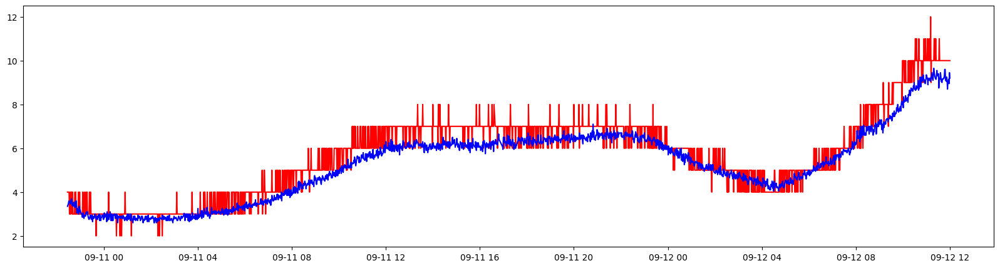

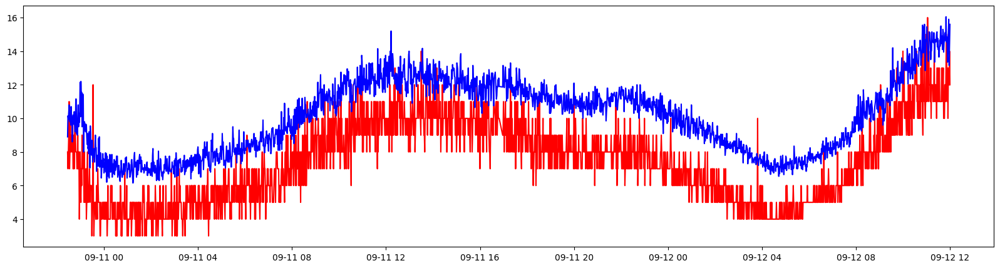

In [35]:
a1 = reduce(lambda x,y: pd.merge(x,y, on='created_at', how='inner'), [aero, BN1])
a1 = a1.dropna()
x = a1['created_at']
y1 = a1['PM2.5_ppb']
y2 = a1['PM2.5']
fig = plt.figure(figsize=(20,5))
plt.plot(x,y1,'r')
plt.plot(x,y2,'b')

x = a1['created_at']
y3 = a1['PM10_ppb']
y4 = a1['PM10']
fig = plt.figure(figsize=(20,5))
plt.plot(x,y3,'r')
plt.plot(x,y4,'b')

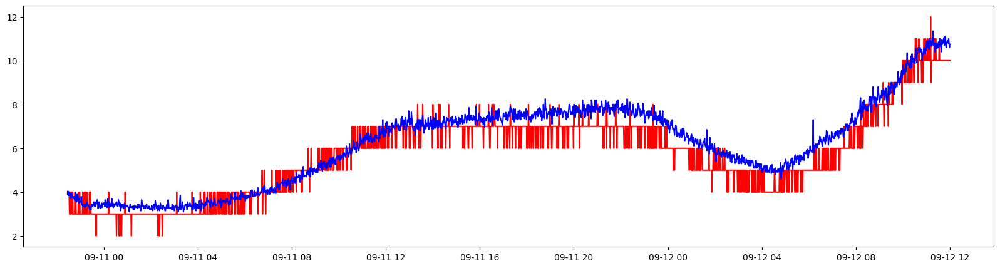

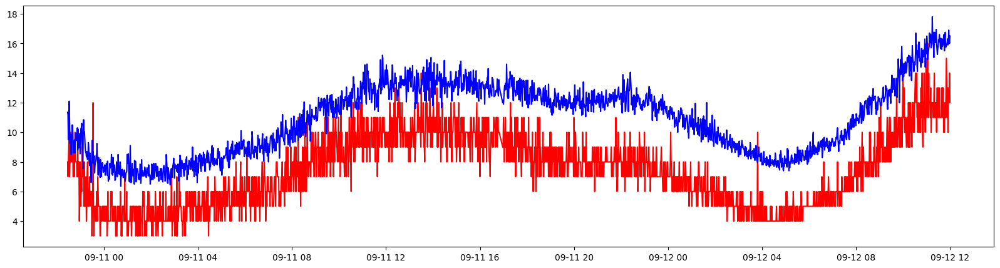

In [36]:
a2 = reduce(lambda x,y: pd.merge(x,y, on='created_at', how='inner'), [aero, BN2])
a2 = a2.dropna()
a2 = a2[a2['PM2.5'] <= 999]
x = a2['created_at']
z1 = a2['PM2.5_ppb']
z2 = a2['PM2.5']
fig = plt.figure(figsize=(20,5))
plt.plot(x,z1,'r')
plt.plot(x,z2,'b')

x = a2['created_at']
z3 = a2['PM10_ppb']
z4 = a2['PM10']
fig = plt.figure(figsize=(20,5))
plt.plot(x,z3,'r')
plt.plot(x,z4,'b')

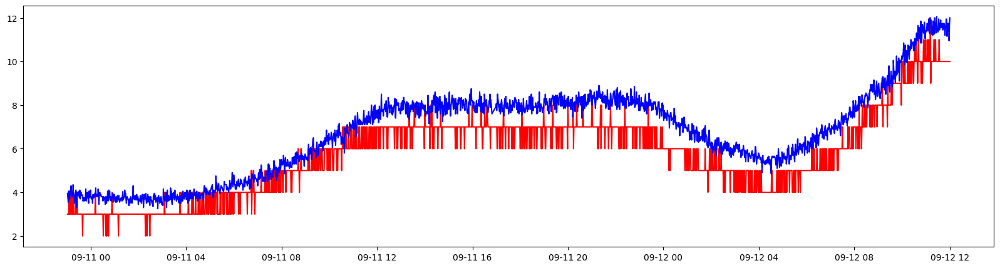

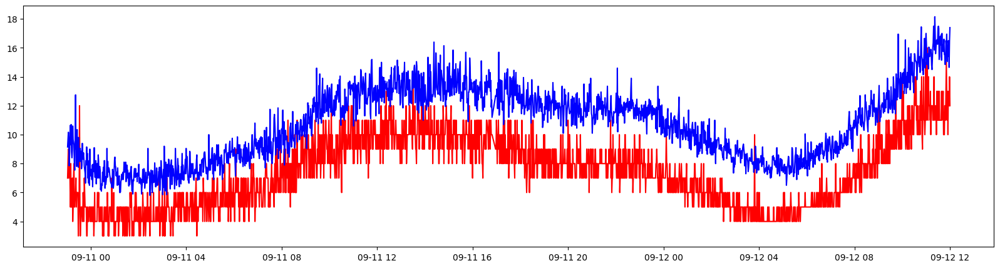

In [37]:
a3 = reduce(lambda x,y: pd.merge(x,y, on='created_at', how='inner'), [aero, BN3])
a3 = a3.dropna()
x = a3['created_at']
s1 = a3['PM2.5_ppb']
s2 = a3['PM2.5']
fig = plt.figure(figsize=(20,5))
plt.plot(x,s1,'r')
plt.plot(x,s2,'b')

x = a3['created_at']
s3 = a3['PM10_ppb']
s4 = a3['PM10']
fig = plt.figure(figsize=(20,5))
plt.plot(x,s3,'r')
plt.plot(x,s4,'b')

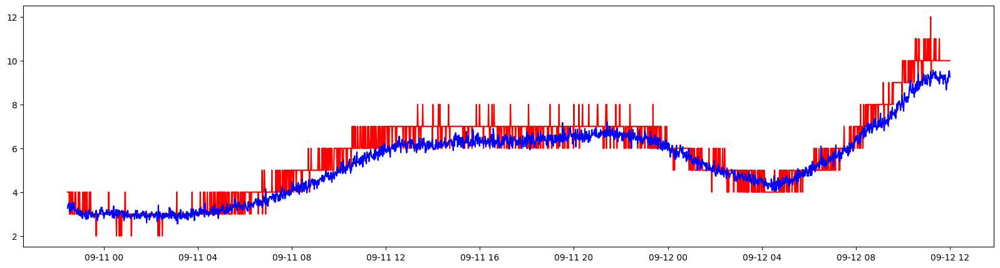

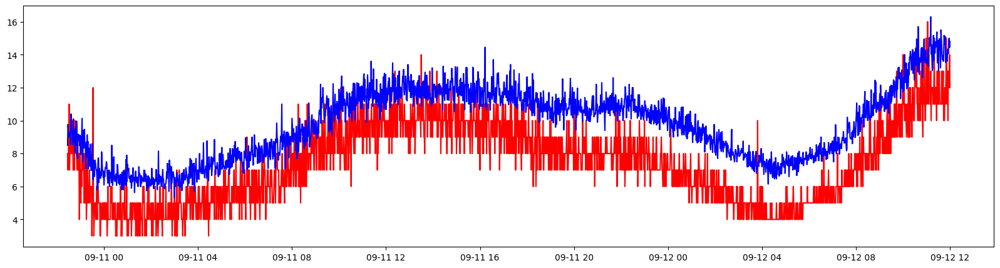

In [38]:
a4 = reduce(lambda x,y: pd.merge(x,y, on='created_at', how='inner'), [aero, BN4])
a4 = a4.dropna()
x = a4['created_at']
t1 = a4['PM2.5_ppb']
t2 = a4['PM2.5']
fig = plt.figure(figsize=(20,5))
plt.plot(x,t1,'r')
plt.plot(x,t2,'b')

x = a4['created_at']
t3 = a4['PM10_ppb']
t4 = a4['PM10']
fig = plt.figure(figsize=(20,5))
plt.plot(x,t3,'r')
plt.plot(x,t4,'b')

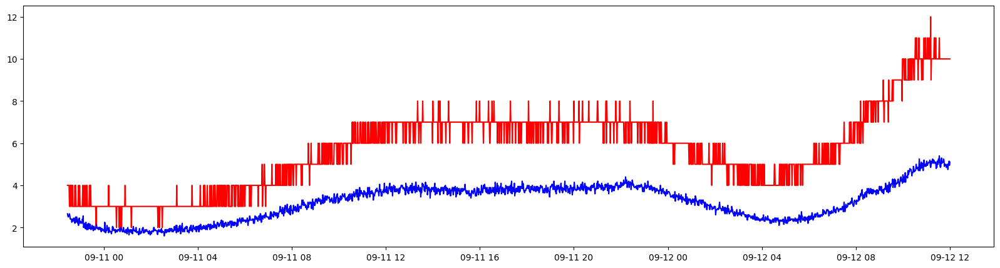

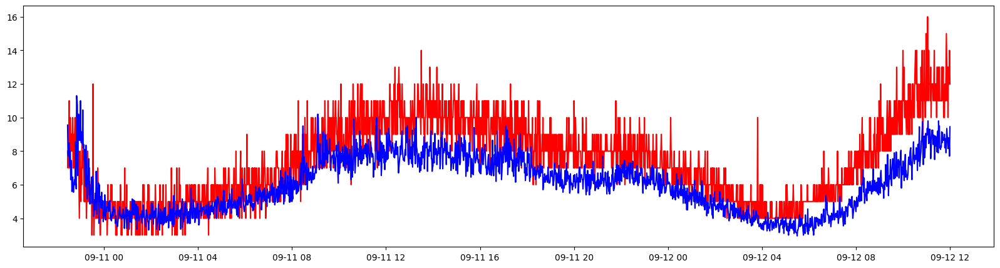

In [42]:
a5 = reduce(lambda x,y: pd.merge(x,y, on='created_at', how='inner'), [aero, BN5])
a5 = a5.dropna()
x = a5['created_at']
p1 = a5['PM2.5_ppb']
p2 = a5['PM2.5']
fig = plt.figure(figsize=(20,5))
plt.plot(x,p1,'r')
plt.plot(x,p2,'b')

x = a5['created_at']
p3 = a5['PM10_ppb']
p4 = a5['PM10']
fig = plt.figure(figsize=(20,5))
plt.plot(x,p3,'r')
plt.plot(x,p4,'b')

In [43]:
o = [a1, a2, a3, a4, a5]
y = [y2, z2, s2, t2, p2]
y_ = [y1, z1, s1, t1, p1]

npts=[None] * len(o)
lag = []
correlation = []
Node = ['PM2.5_BN1', 'PM2.5_BN2', 'PM2.5_BN3', 'PM2.5_BN4', 'PM2.5_BN5']

for i in range(0, len(o)):
    npts[i] = len(o[i])
    lags = np.arange(-npts[i] + 1, npts[i])
    lag.append(lags)
    ccov = np.correlate(y_[i] - y_[i].mean(), y[i] - y[i].mean(), mode='full')
    ccor = ccov / (npts[i] * y_[i].std() * y[i].std())
    correlation.append(ccor)
    maxlag = lags[np.argmax(ccor)]
    print('*************',Node[i],'***************')
    print("max correlation is at lag %d" % maxlag)
    print("max correlation is ", round(max(ccor),3))
    corr, _ = pearsonr(y[i], y_[i])
    print('Pearsons correlation: %.3f' % corr)
    MSE = mean_squared_error(y[i], y_[i])
    MAE = mean_absolute_error(y[i], y_[i])
    print("MSE PM2.5: ", MSE)
    print("MAE PM2.5: ", MAE)
    print("RMSE PM2.5: ", np.sqrt(mean_squared_error(y[i], y_[i])))

# o = [a1,a2,a3,a4]
# y = [y2,z2,c2,d2]
# y_ = [y1,z1,c1,d1]

# npts=[None] * len(o)
# lag = []
# correlation = []
# Node = ['PM2.5_BN1', 'PM2.5_BN2', 'PM2.5_BN3', 'PM2.5_BN4']

# for i in range(0, len(o)):
#     npts[i] = len(o[i])
#     lags = np.arange(-npts[i] + 1, npts[i])
#     lag.append(lags)
#     ccov = np.correlate(y_[i] - y_[i].mean(), y[i] - y[i].mean(), mode='full')
#     ccor = ccov / (npts[i] * y_[i].std() * y[i].std())
#     correlation.append(ccor)
#     maxlag = lags[np.argmax(ccor)]
#     print('*************',Node[i],'***************')
#     print("max correlation is at lag %d" % maxlag)
#     print("max correlation is ", round(max(ccor),3))
#     corr, _ = pearsonr(y[i], y_[i])
#     print('Pearsons correlation: %.3f' % corr)
#     MSE = mean_squared_error(y[i], y_[i])
#     MAE = mean_absolute_error(y[i], y_[i])
#     print("MSE PM2.5: ", MSE)
#     print("MAE PM2.5: ", MAE)
#     print("RMSE PM2.5: ", np.sqrt(mean_squared_error(y[i], y_[i])))

************* PM2.5_BN1 ***************
max correlation is at lag 0
max correlation is  0.964
Pearsons correlation: 0.965
MSE PM2.5:  0.4693838732708612
MAE PM2.5:  0.5560232039268184
RMSE PM2.5:  0.6851159560766784
************* PM2.5_BN2 ***************
max correlation is at lag 0
max correlation is  0.958
Pearsons correlation: 0.958
MSE PM2.5:  0.5199102695225346
MAE PM2.5:  0.5908817492190986
RMSE PM2.5:  0.7210480355167294
************* PM2.5_BN3 ***************
max correlation is at lag 0
max correlation is  0.962
Pearsons correlation: 0.963
MSE PM2.5:  1.2933258803263825
MAE PM2.5:  1.0156101541251132
RMSE PM2.5:  1.1372448638382073
************* PM2.5_BN4 ***************
max correlation is at lag 0
max correlation is  0.961
Pearsons correlation: 0.961
MSE PM2.5:  0.4461495765645806
MAE PM2.5:  0.535272081668886
RMSE PM2.5:  0.6679442915128331
************* PM2.5_BN5 ***************
max correlation is at lag 0
max correlation is  0.941
Pearsons correlation: 0.941
MSE PM2.5:  7.5

In [44]:
o = [a1, a2, a3, a4, a5]
y = [y3, z3, s3, t3, p3]
y_ = [y4, z4, s4, t4, p4]

npts=[None] * len(o)
lag = []
correlation = []
Node = ['PM10_BN1', 'PM10_BN2','PM10_BN3', 'PM10_BN4', 'PM10_BN5']

for i in range(0, len(o)):
    npts[i] = len(o[i])
    lags = np.arange(-npts[i] + 1, npts[i])
    lag.append(lags)
    ccov = np.correlate(y_[i] - y_[i].mean(), y[i] - y[i].mean(), mode='full')
    ccor = ccov / (npts[i] * y_[i].std() * y[i].std())
    correlation.append(ccor)
    maxlag = lags[np.argmax(ccor)]
    print('*************',Node[i],'***************')
    print("max correlation is at lag %d" % maxlag)
    print("max correlation is ", round(max(ccor),3))
    corr, _ = pearsonr(y[i], y_[i])
    print('Pearsons correlation: %.3f' % corr)
    MSE = mean_squared_error(y[i], y_[i])
    MAE = mean_absolute_error(y[i], y_[i])
    print("MSE PM2.5: ", MSE)
    print("MAE PM2.5: ", MAE)
    print("RMSE PM2.5: ", np.sqrt(mean_squared_error(y[i], y_[i])))

# o = [a1,a2,a3,a4]
# y = [y3,z3,c3,d3]
# y_ = [y4,z4,c4,d4]

# npts=[None] * len(o)
# lag = []
# correlation = []
# Node = ['PM10_BN1', 'PM10_BN2', 'PM10_BN3', 'PM10_BN4']

# for i in range(0, len(o)):
#     npts[i] = len(o[i])
#     lags = np.arange(-npts[i] + 1, npts[i])
#     lag.append(lags)
#     ccov = np.correlate(y_[i] - y_[i].mean(), y[i] - y[i].mean(), mode='full')
#     ccor = ccov / (npts[i] * y_[i].std() * y[i].std())
#     correlation.append(ccor)
#     maxlag = lags[np.argmax(ccor)]
#     print('*************',Node[i],'***************')
#     print("max correlation is at lag %d" % maxlag)
#     print("max correlation is ", round(max(ccor),3))
#     corr, _ = pearsonr(y[i], y_[i])
#     print('Pearsons correlation: %.3f' % corr)
#     MSE = mean_squared_error(y[i], y_[i])
#     MAE = mean_absolute_error(y[i], y_[i])
#     print("MSE PM2.5: ", MSE)
#     print("MAE PM2.5: ", MAE)
#     print("RMSE PM2.5: ", np.sqrt(mean_squared_error(y[i], y_[i])))

************* PM10_BN1 ***************
max correlation is at lag 0
max correlation is  0.871
Pearsons correlation: 0.872
MSE PM2.5:  8.455159182061578
MAE PM2.5:  2.683512271307452
RMSE PM2.5:  2.907775641630829
************* PM10_BN2 ***************
max correlation is at lag 1
max correlation is  0.862
Pearsons correlation: 0.860
MSE PM2.5:  13.638134455600177
MAE PM2.5:  3.483236501561803
RMSE PM2.5:  3.6929844916544368
************* PM10_BN3 ***************
max correlation is at lag 1
max correlation is  0.853
Pearsons correlation: 0.850
MSE PM2.5:  12.707831762919312
MAE PM2.5:  3.316681323662738
RMSE PM2.5:  3.564804589724283
************* PM10_BN4 ***************
max correlation is at lag -2
max correlation is  0.856
Pearsons correlation: 0.852
MSE PM2.5:  6.939750031513537
MAE PM2.5:  2.3767185974256546
RMSE PM2.5:  2.634340530666743
************* PM10_BN5 ***************
max correlation is at lag 21
max correlation is  0.818
Pearsons correlation: 0.811
MSE PM2.5:  4.02925354222

# Node 1 Coefficients


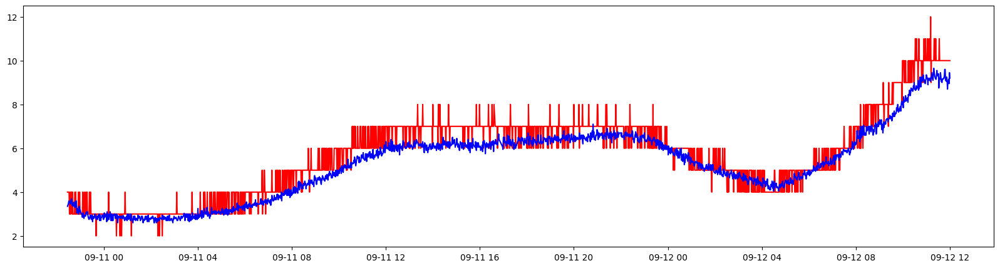

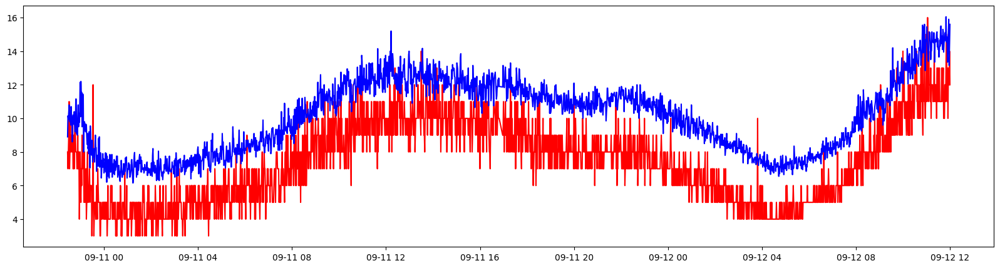

In [45]:
a1 = reduce(lambda x,y: pd.merge(x,y, on='created_at', how='inner'), [aero, BN1])
a1 = a1.dropna()
a1 = a1[a1['PM2.5'] <= 999]
x = a1['created_at']
y1 = a1['PM2.5_ppb']
y2 = a1['PM2.5']
fig = plt.figure(figsize=(20,5))
plt.plot(x,y1,'r')
plt.plot(x,y2,'b')

x = a1['created_at']
y3 = a1['PM10_ppb']
y4 = a1['PM10']
fig = plt.figure(figsize=(20,5))
plt.plot(x,y3,'r')
plt.plot(x,y4,'b')

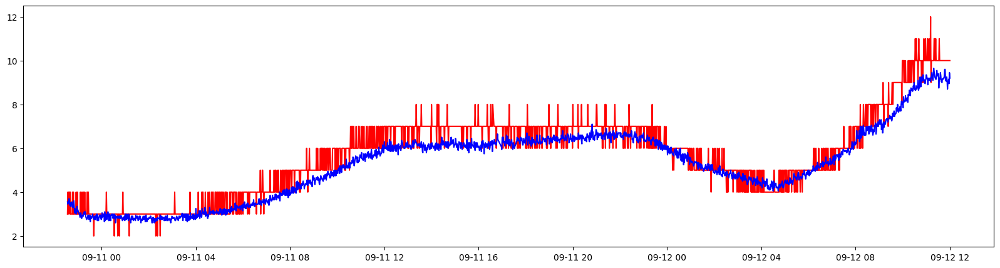

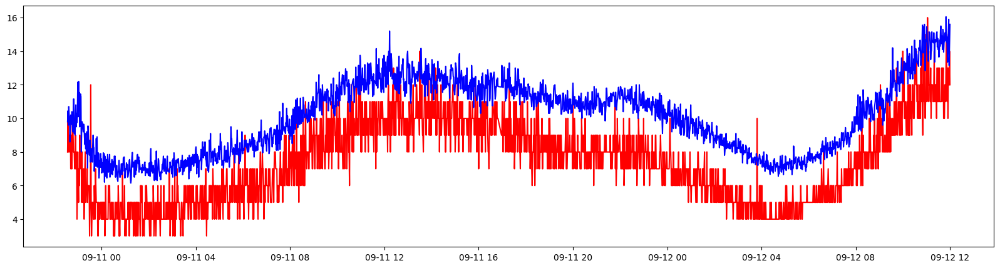

In [47]:
a1['PM2.5_shift'] = a1['PM2.5'].shift(0)
a1['PM10_shift'] = a1['PM10'].shift(0)

a1 = a1.dropna()
x = a1['created_at']
y_1 = a1['PM2.5_ppb']
y_2 = a1['PM2.5_shift']
fig = plt.figure(figsize=(20,5))
plt.plot(x,y_1,'r')
plt.plot(x,y_2,'b')

x = a1['created_at']
y_3 = a1['PM10_ppb']
y_4 = a1['PM10_shift']
fig = plt.figure(figsize=(20,5))
plt.plot(x,y_3,'r')
plt.plot(x,y_4,'b')

In [48]:
npts = len(a1)
lags = np.arange(-npts + 1, npts)
lag.append(lags)
ccov = np.correlate(y_1 - y_1.mean(), y_2 - y_2.mean(), mode='full')
ccor = ccov / (npts * y_1.std() * y_2.std())
correlation.append(ccor)
maxlag = lags[np.argmax(ccor)]
#print('*************',Node[i],'***************')
print("max correlation is at lag %d" % maxlag)
print("max correlation is ", round(max(ccor),3))
corr, _ = pearsonr(y_2, y_1)
print('Pearsons correlation: %.3f' % corr)
MSE = mean_squared_error(y_2, y_1)
MAE = mean_absolute_error(y_2, y_1)
print("MSE PM2.5: ", MSE)
print("MAE PM2.5: ", MAE)
print("RMSE PM2.5: ", np.sqrt(mean_squared_error(y_2, y_1)))

npts = len(a1)
lags = np.arange(-npts + 1, npts)
lag.append(lags)
ccov = np.correlate(y_3 - y_3.mean(), y_4 - y_4.mean(), mode='full')
ccor = ccov / (npts * y_3.std() * y_4.std())
correlation.append(ccor)
maxlag = lags[np.argmax(ccor)]
#print('*************',Node[i],'***************')
print("max correlation is at lag %d" % maxlag)
print("max correlation is ", round(max(ccor),3))
corr, _ = pearsonr(y_4, y_3)
print('Pearsons correlation: %.3f' % corr)
MSE = mean_squared_error(y_4, y_3)
MAE = mean_absolute_error(y_4, y_3)
print("MSE PM10: ", MSE)
print("MAE PM10: ", MAE)
print("RMSE PM10: ", np.sqrt(mean_squared_error(y_4, y_3)))

max correlation is at lag 0
max correlation is  0.964
Pearsons correlation: 0.965
MSE PM2.5:  0.469860966442953
MAE PM2.5:  0.5560841163310962
RMSE PM2.5:  0.6854640518969269
max correlation is at lag 0
max correlation is  0.872
Pearsons correlation: 0.872
MSE PM10:  8.466019788366891
MAE PM10:  2.6859064876957497
RMSE PM10:  2.909642553367491


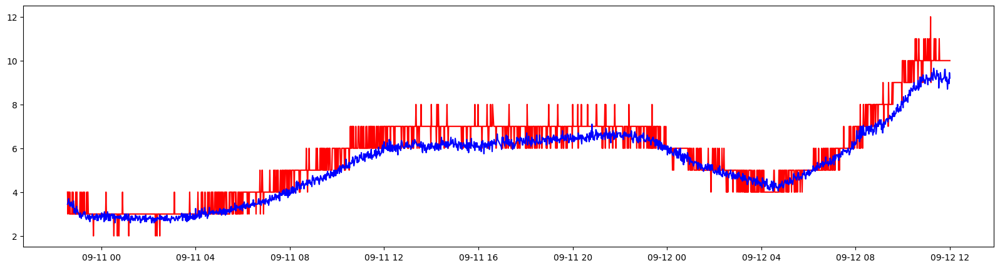

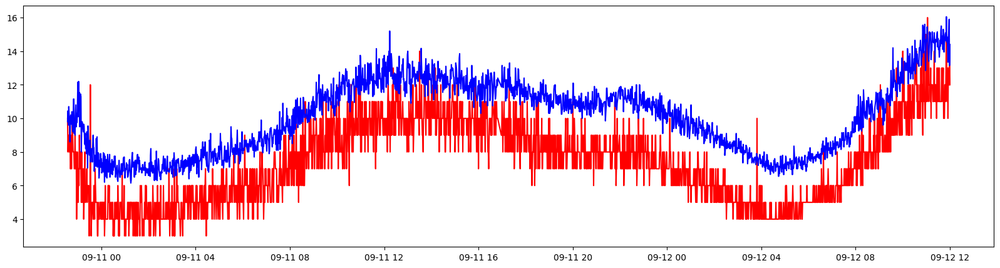

In [49]:
a1['PM2.5_shift'] = a1['PM2.5_shift'].shift(0)
a1['PM10_shift'] = a1['PM10_shift'].shift(0)

a1 = a1.dropna()
x = a1['created_at']
y_1 = a1['PM2.5_ppb']
y_2 = a1['PM2.5_shift']
fig = plt.figure(figsize=(20,5))
plt.plot(x,y_1,'r')
plt.plot(x,y_2,'b')

x = a1['created_at']
y_3 = a1['PM10_ppb']
y_4 = a1['PM10_shift']
fig = plt.figure(figsize=(20,5))
plt.plot(x,y_3,'r')
plt.plot(x,y_4,'b')

In [50]:
npts = len(a1)
lags = np.arange(-npts + 1, npts)
lag.append(lags)
ccov = np.correlate(y_1 - y_1.mean(), y_2 - y_2.mean(), mode='full')
ccor = ccov / (npts * y_1.std() * y_2.std())
correlation.append(ccor)
maxlag = lags[np.argmax(ccor)]
#print('*************',Node[i],'***************')
print("max correlation is at lag %d" % maxlag)
print("max correlation is ", round(max(ccor),3))
corr, _ = pearsonr(y_2, y_1)
print('Pearsons correlation: %.3f' % corr)
MSE = mean_squared_error(y_2, y_1)
MAE = mean_absolute_error(y_2, y_1)
print("MSE PM2.5: ", MSE)
print("MAE PM2.5: ", MAE)
print("RMSE PM2.5: ", np.sqrt(mean_squared_error(y_2, y_1)))

npts = len(a1)
lags = np.arange(-npts + 1, npts)
lag.append(lags)
ccov = np.correlate(y_3 - y_3.mean(), y_4 - y_4.mean(), mode='full')
ccor = ccov / (npts * y_3.std() * y_4.std())
correlation.append(ccor)
maxlag = lags[np.argmax(ccor)]
#print('*************',Node[i],'***************')
print("max correlation is at lag %d" % maxlag)
print("max correlation is ", round(max(ccor),3))
corr, _ = pearsonr(y_4, y_3)
print('Pearsons correlation: %.3f' % corr)
MSE = mean_squared_error(y_4, y_3)
MAE = mean_absolute_error(y_4, y_3)
print("MSE PM10: ", MSE)
print("MAE PM10: ", MAE)
print("RMSE PM10: ", np.sqrt(mean_squared_error(y_4, y_3)))

max correlation is at lag 0
max correlation is  0.964
Pearsons correlation: 0.965
MSE PM2.5:  0.46993588182632057
MAE PM2.5:  0.5560868397493285
RMSE PM2.5:  0.6855186954608318
max correlation is at lag -1
max correlation is  0.871
Pearsons correlation: 0.866
MSE PM10:  8.514813888540735
MAE PM10:  2.690047896150403
RMSE PM10:  2.9180154023823683


In [51]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LinearRegression
from sklearn import metrics
from scipy.stats import spearmanr, pearsonr
X = a1['PM2.5_shift']
y = a1['PM2.5_ppb']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.2, random_state= 0)
regressor = LinearRegression()
regressor.fit(X_train.values.reshape(-1,1), y_train)

print ('Coefficients: ', regressor.coef_)
print ('Intercept: ',regressor.intercept_)

test_y_hat = regressor.predict(X_test.values.reshape(-1,1))
ssr = np.sum((test_y_hat - y_test)**2)
ssr

    #  total sum of squares
sst = np.sum((y_test - np.mean(y_test))**2)
sst

    # R2 score
r2 = 1 - (ssr/sst)
print("R2 ", r2)

    # MAE
print("MAE of simple linear regression of ", metrics.mean_absolute_error(y_test,test_y_hat))

    #MSE
print("MSE of simple linear regression", mean_squared_error(y_test, test_y_hat))

   #RMSE
print("RMSE of simple linear regression", np.sqrt(mean_squared_error(y_test, test_y_hat)))

spearman = spearmanr(y_test, test_y_hat)
spearman1 = spearmanr(X_train.values.reshape(-1,1), y_train)
print(f'Test data Spearman correlation of simple linear regression: {spearman[0]:.3}')

    #print(f'Train data Spearman correlation of simple linear regression: {spearman1[0]:.3}')

Coefficients:  [1.11334987]
Intercept:  -0.16948178787182844
R2  0.9403670497306136
MAE of simple linear regression of  0.3549488021785531
MSE of simple linear regression 0.22284587801973343
RMSE of simple linear regression 0.4720655441988257
Test data Spearman correlation of simple linear regression: 0.951


In [52]:

X = a1['PM10_shift']
y = a1['PM10_ppb']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.2, random_state= 0)
regressor = LinearRegression()
regressor.fit(X_train.values.reshape(-1,1), y_train)

print ('Coefficients: ', regressor.coef_)
print ('Intercept: ',regressor.intercept_)

test_y_hat = regressor.predict(X_test.values.reshape(-1,1))
ssr = np.sum((test_y_hat - y_test)**2)
ssr

    #  total sum of squares
sst = np.sum((y_test - np.mean(y_test))**2)
sst

    # R2 score
r2 = 1 - (ssr/sst)
print("R2 ", r2)

    # MAE
print("MAE of simple linear regression of ", metrics.mean_absolute_error(y_test,test_y_hat))

    #MSE
print("MSE of simple linear regression", mean_squared_error(y_test, test_y_hat))

   #RMSE
print("RMSE of simple linear regression", np.sqrt(mean_squared_error(y_test, test_y_hat)))

spearman = spearmanr(y_test, test_y_hat)
spearman1 = spearmanr(X_train.values.reshape(-1,1), y_train)
print(f'Test data Spearman correlation of simple linear regression: {spearman[0]:.3}')

    #print(f'Train data Spearman correlation of simple linear regression: {spearman1[0]:.3}')

Coefficients:  [0.97002475]
Intercept:  -2.3727663609688294
R2  0.7657600799721245
MAE of simple linear regression of  0.8944160826148658
MSE of simple linear regression 1.3296021933871616
RMSE of simple linear regression 1.153083775528544
Test data Spearman correlation of simple linear regression: 0.883


# Node 2 Coefficients

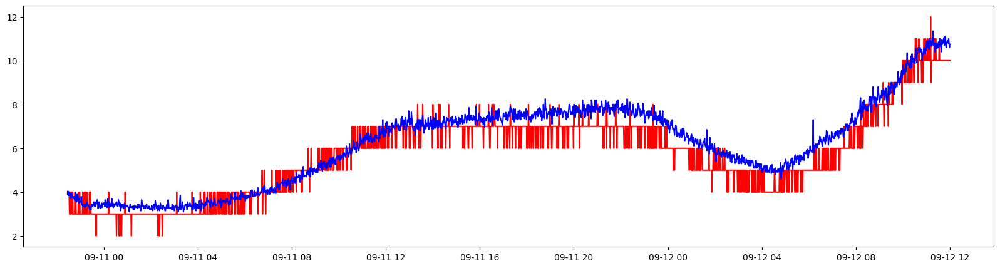

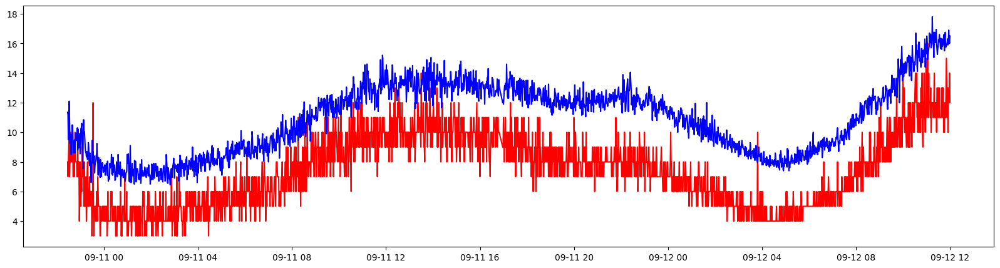

In [60]:
a2 = reduce(lambda x,y: pd.merge(x,y, on='created_at', how='inner'), [aero, BN2])
a2 = a2.dropna()
a2 = a2[a2['PM2.5'] <= 999]
x = a2['created_at']
z1 = a2['PM2.5_ppb']
z2 = a2['PM2.5']
fig = plt.figure(figsize=(20,5))
plt.plot(x,z1,'r')
plt.plot(x,z2,'b')

x = a2['created_at']
z3 = a2['PM10_ppb']
z4 = a2['PM10']
fig = plt.figure(figsize=(20,5))
plt.plot(x,z3,'r')
plt.plot(x,z4,'b')

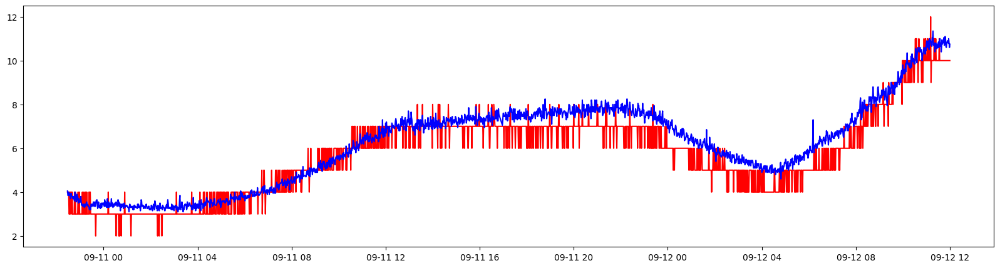

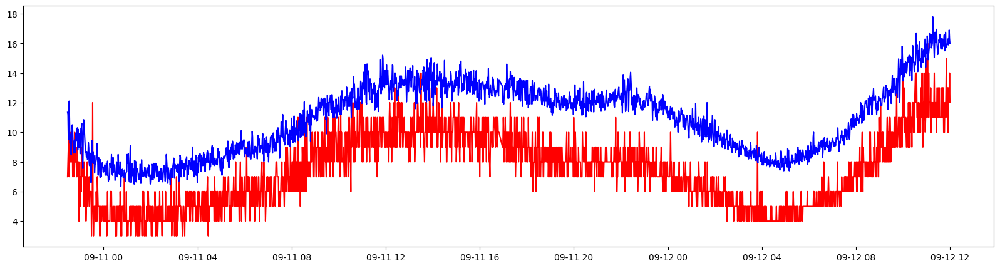

In [61]:
a2['PM2.5_shift'] = a2['PM2.5'].shift(0)
a2['PM10_shift'] = a2['PM10'].shift(1)

a2 = a2.dropna()
x = a2['created_at']
z_1 = a2['PM2.5_ppb']
z_2 = a2['PM2.5_shift']
fig = plt.figure(figsize=(20,5))
plt.plot(x,z_1,'r')
plt.plot(x,z_2,'b')

x = a2['created_at']
z_3 = a2['PM10_ppb']
z_4 = a2['PM10_shift']
fig = plt.figure(figsize=(20,5))
plt.plot(x,z_3,'r')
plt.plot(x,z_4,'b')

In [62]:
npts = len(a2)
lags = np.arange(-npts + 1, npts)
lag.append(lags)
ccov = np.correlate(z_1 - z_1.mean(), z_2 - z_2.mean(), mode='full')
ccor = ccov / (npts * z_1.std() * z_2.std())
correlation.append(ccor)
maxlag = lags[np.argmax(ccor)]
#print('*************',Node[i],'***************')
print("max correlation is at lag %d" % maxlag)
print("max correlation is ", round(max(ccor),3))
corr, _ = pearsonr(z_2, z_1)
print('Pearsons correlation: %.3f' % corr)
MSE = mean_squared_error(z_2, z_1)
MAE = mean_absolute_error(z_2, z_1)
print("MSE PM2.5: ", MSE)
print("MAE PM2.5: ", MAE)
print("RMSE PM2.5: ", np.sqrt(mean_squared_error(z_2, z_1)))

npts = len(a2)
lags = np.arange(-npts + 1, npts)
lag.append(lags)
ccov = np.correlate(z_3 - z_3.mean(), z_4 - z_4.mean(), mode='full')
ccor = ccov / (npts * z_3.std() * z_4.std())
correlation.append(ccor)
maxlag = lags[np.argmax(ccor)]
#print('*************',Node[i],'***************')
print("max correlation is at lag %d" % maxlag)
print("max correlation is ", round(max(ccor),3))
corr, _ = pearsonr(z_4, z_3)
print('Pearsons correlation: %.3f' % corr)
MSE = mean_squared_error(z_4, z_3)
MAE = mean_absolute_error(z_4, z_3)
print("MSE PM10: ", MSE)
print("MAE PM10: ", MAE)
print("RMSE PM10: ", np.sqrt(mean_squared_error(z_4, z_3)))

max correlation is at lag 0
max correlation is  0.958
Pearsons correlation: 0.958
MSE PM2.5:  0.5201379080357144
MAE PM2.5:  0.5911008928571428
RMSE PM2.5:  0.7212058707718029
max correlation is at lag 0
max correlation is  0.862
Pearsons correlation: 0.862
MSE PM10:  13.59418808705357
MAE PM10:  3.481041517857143
RMSE PM10:  3.687029710627997


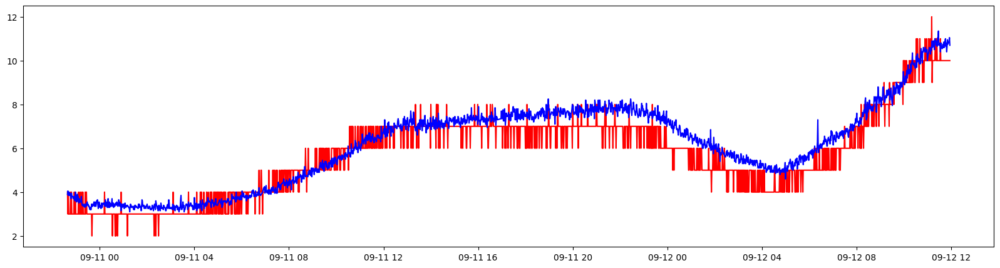

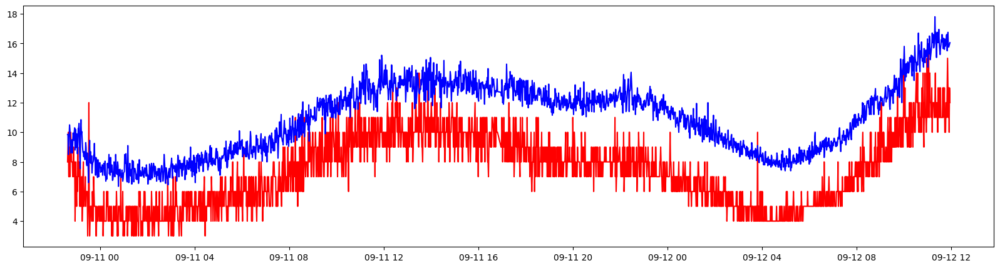

In [ ]:
a2['PM2.5_shift'] = a2['PM2.5_shift'].shift(0)
a2['PM10_shift'] = a2['PM10_shift'].shift(-3)

a2 = a2.dropna()
x = a2['created_at']
z_1 = a2['PM2.5_ppb']
z_2 = a2['PM2.5_shift']
fig = plt.figure(figsize=(20,5))
plt.plot(x,z_1,'r')
plt.plot(x,z_2,'b')

x = a2['created_at']
z_3 = a2['PM10_ppb']
z_4 = a2['PM10_shift']
fig = plt.figure(figsize=(20,5))
plt.plot(x,z_3,'r')
plt.plot(x,z_4,'b')

In [ ]:
npts = len(a2)
lags = np.arange(-npts + 1, npts)
lag.append(lags)
ccov = np.correlate(z_1 - z_1.mean(), z_2 - z_2.mean(), mode='full')
ccor = ccov / (npts * z_1.std() * z_2.std())
correlation.append(ccor)
maxlag = lags[np.argmax(ccor)]
#print('*************',Node[i],'***************')
print("max correlation is at lag %d" % maxlag)
print("max correlation is ", round(max(ccor),3))
corr, _ = pearsonr(z_2, z_1)
print('Pearsons correlation: %.3f' % corr)
MSE = mean_squared_error(z_2, z_1)
MAE = mean_absolute_error(z_2, z_1)
print("MSE PM2.5: ", MSE)
print("MAE PM2.5: ", MAE)
print("RMSE PM2.5: ", np.sqrt(mean_squared_error(z_2, z_1)))

npts = len(a2)
lags = np.arange(-npts + 1, npts)
lag.append(lags)
ccov = np.correlate(z_3 - z_3.mean(), z_4 - z_4.mean(), mode='full')
ccor = ccov / (npts * z_3.std() * z_4.std())
correlation.append(ccor)
maxlag = lags[np.argmax(ccor)]
#print('*************',Node[i],'***************')
print("max correlation is at lag %d" % maxlag)
print("max correlation is ", round(max(ccor),3))
corr, _ = pearsonr(z_4, z_3)
print('Pearsons correlation: %.3f' % corr)
MSE = mean_squared_error(z_4, z_3)
MAE = mean_absolute_error(z_4, z_3)
print("MSE PM10: ", MSE)
print("MAE PM10: ", MAE)
print("RMSE PM10: ", np.sqrt(mean_squared_error(z_4, z_3)))

max correlation is at lag 0
max correlation is  0.953
Pearsons correlation: 0.953
MSE PM2.5:  0.5187967732375393
MAE PM2.5:  0.5903969465648855
RMSE PM2.5:  0.7202754842680259
max correlation is at lag -3
max correlation is  0.861
Pearsons correlation: 0.856
MSE PM10:  13.646204901212391
MAE PM10:  3.481364616075438
RMSE PM10:  3.694077002610042


In [63]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
X = a2['PM2.5_shift']
y = a2['PM2.5_ppb']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.2, random_state= 0)
regressor = LinearRegression()
regressor.fit(X_train.values.reshape(-1,1), y_train)

print ('Coefficients: ', regressor.coef_)
print ('Intercept: ',regressor.intercept_)

test_y_hat = regressor.predict(X_test.values.reshape(-1,1))
ssr = np.sum((test_y_hat - y_test)**2)
ssr

    #  total sum of squares
sst = np.sum((y_test - np.mean(y_test))**2)
sst

    # R2 score
r2 = 1 - (ssr/sst)
print("R2 ", r2)

    # MAE
print("MAE of simple linear regression of ", metrics.mean_absolute_error(y_test,test_y_hat))

    #MSE
print("MSE of simple linear regression", mean_squared_error(y_test, test_y_hat))

   #RMSE
print("RMSE of simple linear regression", np.sqrt(mean_squared_error(y_test, test_y_hat)))

spearman = spearmanr(y_test, test_y_hat)
spearman1 = spearmanr(X_train.values.reshape(-1,1), y_train)
print(f'Test data Spearman correlation of simple linear regression: {spearman[0]:.3}')

    #print(f'Train data Spearman correlation of simple linear regression: {spearman1[0]:.3}')


Coefficients:  [0.93015168]
Intercept:  -0.040799815007715345
R2  0.9268346145686632
MAE of simple linear regression of  0.3896132516161435
MSE of simple linear regression 0.26941823329550973
RMSE of simple linear regression 0.5190551351210291
Test data Spearman correlation of simple linear regression: 0.941


In [64]:

X = a2['PM10_shift']
y = a2['PM10_ppb']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.2, random_state= 0)
regressor = LinearRegression()
regressor.fit(X_train.values.reshape(-1,1), y_train)

print ('Coefficients: ', regressor.coef_)
print ('Intercept: ',regressor.intercept_)

test_y_hat = regressor.predict(X_test.values.reshape(-1,1))
ssr = np.sum((test_y_hat - y_test)**2)
ssr

    #  total sum of squares
sst = np.sum((y_test - np.mean(y_test))**2)
sst

    # R2 score
r2 = 1 - (ssr/sst)
print("R2 ", r2)

    # MAE
print("MAE of simple linear regression of ", metrics.mean_absolute_error(y_test,test_y_hat))

    #MSE
print("MSE of simple linear regression", mean_squared_error(y_test, test_y_hat))

   #RMSE
print("RMSE of simple linear regression", np.sqrt(mean_squared_error(y_test, test_y_hat)))

spearman = spearmanr(y_test, test_y_hat)
spearman1 = spearmanr(X_train.values.reshape(-1,1), y_train)
print(f'Test data Spearman correlation of simple linear regression: {spearman[0]:.3}')

    #print(f'Train data Spearman correlation of simple linear regression: {spearman1[0]:.3}')


Coefficients:  [0.87706109]
Intercept:  -2.1356714899294023
R2  0.7332556361861525
MAE of simple linear regression of  0.9609311507214068
MSE of simple linear regression 1.4687300536300936
RMSE of simple linear regression 1.21191173508226
Test data Spearman correlation of simple linear regression: 0.853


# **node3**

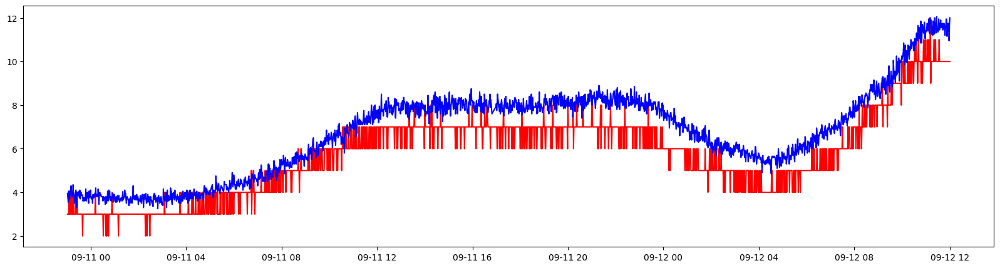

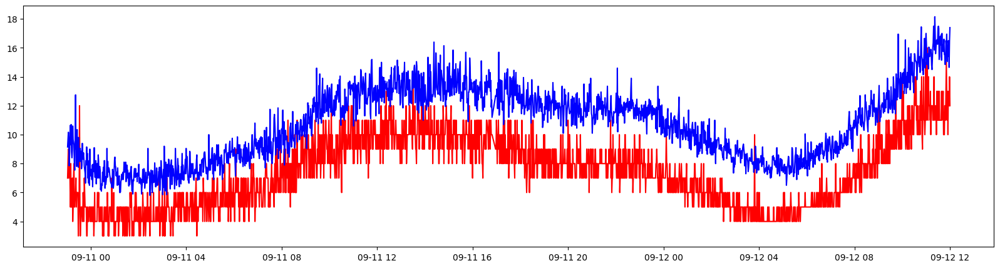

In [65]:
a3 = reduce(lambda x,y: pd.merge(x,y, on='created_at', how='inner'), [aero, BN3])
a3 = a3.dropna()
a3 = a3[a3['PM2.5'] <= 999]
x = a3['created_at']
s1 = a3['PM2.5_ppb']
s2 = a3['PM2.5']
fig = plt.figure(figsize=(20,5))
plt.plot(x,s1,'r')
plt.plot(x,s2,'b')

x = a3['created_at']
s3 = a3['PM10_ppb']
s4 = a3['PM10']
fig = plt.figure(figsize=(20,5))
plt.plot(x,s3,'r')
plt.plot(x,s4,'b')

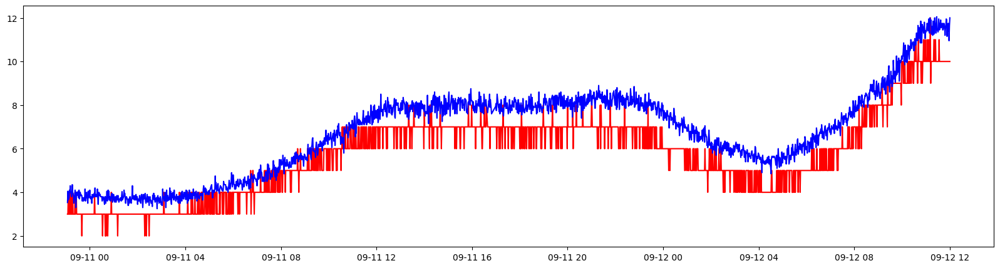

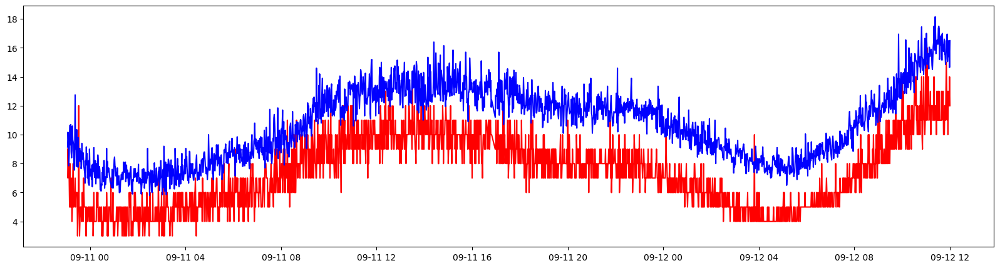

In [66]:
a3['PM2.5_shift'] = a3['PM2.5'].shift(0)
a3['PM10_shift'] = a3['PM10'].shift(1)

a3 = a3.dropna()
x = a3['created_at']
s_1 = a3['PM2.5_ppb']
s_2 = a3['PM2.5_shift']
fig = plt.figure(figsize=(20,5))
plt.plot(x,s_1,'r')
plt.plot(x,s_2,'b')

x = a3['created_at']
s_3 = a3['PM10_ppb']
s_4 = a3['PM10_shift']
fig = plt.figure(figsize=(20,5))
plt.plot(x,s_3,'r')
plt.plot(x,s_4,'b')

In [67]:
npts = len(a3)
lags = np.arange(-npts + 1, npts)
lag.append(lags)
ccov = np.correlate(s_1 - s_1.mean(), s_2 - s_2.mean(), mode='full')
ccor = ccov / (npts * s_1.std() * s_2.std())
correlation.append(ccor)
maxlag = lags[np.argmax(ccor)]
#print('*************',Node[i],'***************')
print("max correlation is at lag %d" % maxlag)
print("max correlation is ", round(max(ccor),3))
corr, _ = pearsonr(s_2, s_1)
print('Pearsons correlation: %.3f' % corr)
MSE = mean_squared_error(s_2, s_1)
MAE = mean_absolute_error(s_2, s_1)
print("MSE PM2.5: ", MSE)
print("MAE PM2.5: ", MAE)
print("RMSE PM2.5: ", np.sqrt(mean_squared_error(s_2, s_1)))

npts = len(a3)
lags = np.arange(-npts + 1, npts)
lag.append(lags)
ccov = np.correlate(s_3 - s_3.mean(), s_4 - s_4.mean(), mode='full')
ccor = ccov / (npts * s_3.std() * s_4.std())
correlation.append(ccor)
maxlag = lags[np.argmax(ccor)]
#print('*************',Node[i],'***************')
print("max correlation is at lag %d" % maxlag)
print("max correlation is ", round(max(ccor),3))
corr, _ = pearsonr(s_4, s_3)
print('Pearsons correlation: %.3f' % corr)
MSE = mean_squared_error(s_4, s_3)
MAE = mean_absolute_error(s_4, s_3)
print("MSE PM10: ", MSE)
print("MAE PM10: ", MAE)
print("RMSE PM10: ", np.sqrt(mean_squared_error(s_4, s_3)))

max correlation is at lag 0
max correlation is  0.962
Pearsons correlation: 0.963
MSE PM2.5:  1.2935031256235827
MAE PM2.5:  1.015639909297052
RMSE PM2.5:  1.1373227886680117
max correlation is at lag 0
max correlation is  0.851
Pearsons correlation: 0.852
MSE PM10:  12.66854642585034
MAE PM10:  3.316507482993197
RMSE PM10:  3.5592901575806293


In [68]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
X = a3['PM2.5_shift']
y = a3['PM2.5_ppb']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.2, random_state= 0)
regressor = LinearRegression()
regressor.fit(X_train.values.reshape(-1,1), y_train)

print ('Coefficients: ', regressor.coef_)
print ('Intercept: ',regressor.intercept_)

test_y_hat = regressor.predict(X_test.values.reshape(-1,1))
ssr = np.sum((test_y_hat - y_test)**2)
ssr

    #  total sum of squares
sst = np.sum((y_test - np.mean(y_test))**2)
sst

    # R2 score
r2 = 1 - (ssr/sst)
print("R2 ", r2)

    # MAE
print("MAE of simple linear regression of ", metrics.mean_absolute_error(y_test,test_y_hat))

    #MSE
print("MSE of simple linear regression", mean_squared_error(y_test, test_y_hat))

   #RMSE
print("RMSE of simple linear regression", np.sqrt(mean_squared_error(y_test, test_y_hat)))

spearman = spearmanr(y_test, test_y_hat)
spearman1 = spearmanr(X_train.values.reshape(-1,1), y_train)
print(f'Test data Spearman correlation of simple linear regression: {spearman[0]:.3}')

    #print(f'Train data Spearman correlation of simple linear regression: {spearman1[0]:.3}')






    # /pm10

X = a3['PM10_shift']
y = a3['PM10_ppb']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.2, random_state= 0)
regressor = LinearRegression()
regressor.fit(X_train.values.reshape(-1,1), y_train)

print ('Coefficients: ', regressor.coef_)
print ('Intercept: ',regressor.intercept_)

test_y_hat = regressor.predict(X_test.values.reshape(-1,1))
ssr = np.sum((test_y_hat - y_test)**2)
ssr

    #  total sum of squares
sst = np.sum((y_test - np.mean(y_test))**2)
sst

    # R2 score
r2 = 1 - (ssr/sst)
print("R2 ", r2)

    # MAE
print("MAE of simple linear regression of ", metrics.mean_absolute_error(y_test,test_y_hat))

    #MSE
print("MSE of simple linear regression", mean_squared_error(y_test, test_y_hat))

   #RMSE
print("RMSE of simple linear regression", np.sqrt(mean_squared_error(y_test, test_y_hat)))

spearman = spearmanr(y_test, test_y_hat)
spearman1 = spearmanr(X_train.values.reshape(-1,1), y_train)
print(f'Test data Spearman correlation of simple linear regression: {spearman[0]:.3}')

    #print(f'Train data Spearman correlation of simple linear regression: {spearman1[0]:.3}')



Coefficients:  [0.89863004]
Intercept:  -0.32065264857330433
R2  0.9323977296159999
MAE of simple linear regression of  0.3699021413392564
MSE of simple linear regression 0.23920471806413587
RMSE of simple linear regression 0.4890855938014694
Test data Spearman correlation of simple linear regression: 0.947
Coefficients:  [0.81439719]
Intercept:  -1.303864500895843
R2  0.7313872520193212
MAE of simple linear regression of  0.9376766784091388
MSE of simple linear regression 1.5374022958786377
RMSE of simple linear regression 1.2399202780334861
Test data Spearman correlation of simple linear regression: 0.867


# **node 4**


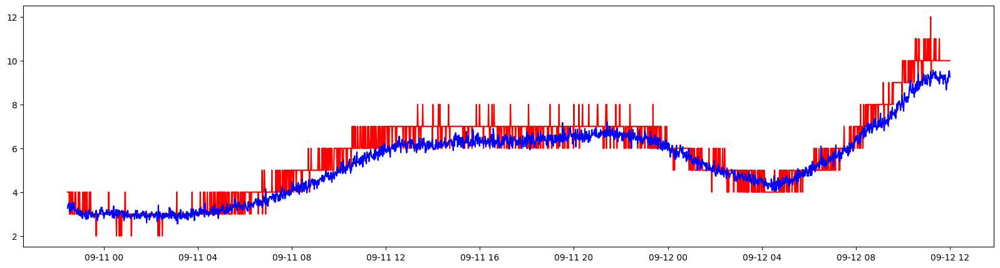

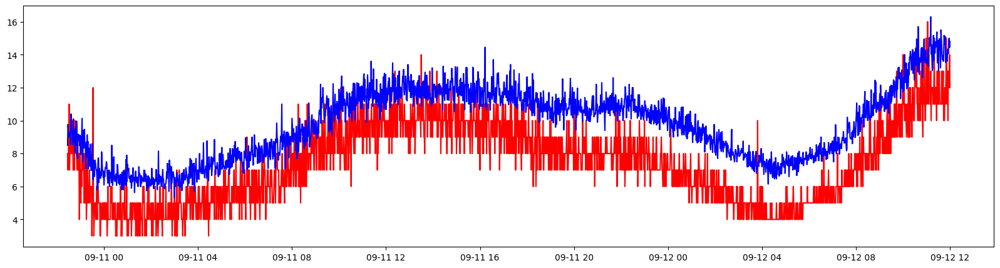

In [69]:
a4 = reduce(lambda x,y: pd.merge(x,y, on='created_at', how='inner'), [aero, BN4])
a4 = a4.dropna()
a4 = a4[a4['PM2.5'] <= 999]
x = a4['created_at']
s1 = a4['PM2.5_ppb']
s2 = a4['PM2.5']
fig = plt.figure(figsize=(20,5))
plt.plot(x,s1,'r')
plt.plot(x,s2,'b')

x = a4['created_at']
s3 = a4['PM10_ppb']
s4 = a4['PM10']
fig = plt.figure(figsize=(20,5))
plt.plot(x,s3,'r')
plt.plot(x,s4,'b')

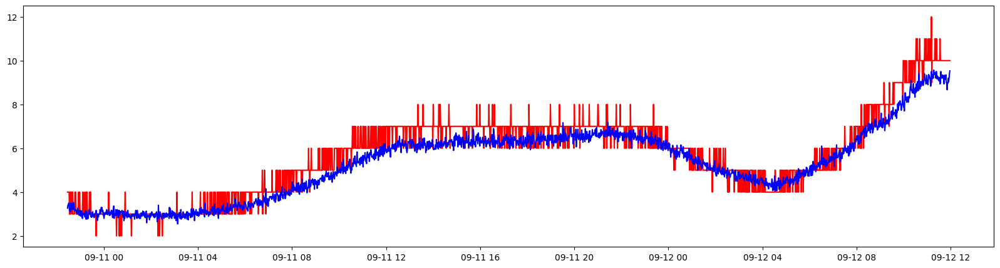

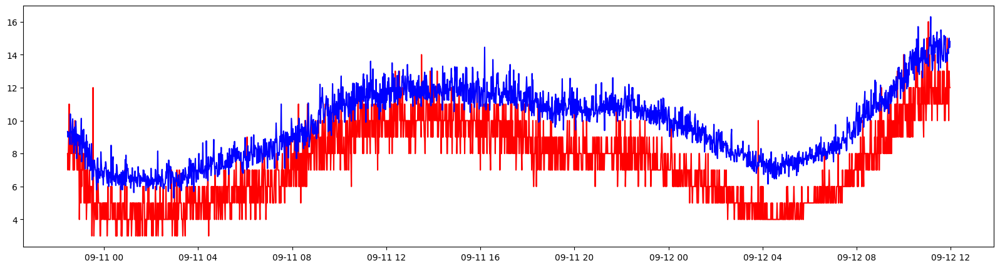

In [70]:
a4['PM2.5_shift'] = a4['PM2.5'].shift(0)
a4['PM10_shift'] = a4['PM10'].shift(-2)

a4 = a4.dropna()
x = a4['created_at']
s_1 = a4['PM2.5_ppb']
s_2 = a4['PM2.5_shift']
fig = plt.figure(figsize=(20,5))
plt.plot(x,s_1,'r')
plt.plot(x,s_2,'b')

x = a4['created_at']
s_3 = a4['PM10_ppb']
s_4 = a4['PM10_shift']
fig = plt.figure(figsize=(20,5))
plt.plot(x,s_3,'r')
plt.plot(x,s_4,'b')

In [71]:
npts = len(a4)
lags = np.arange(-npts + 1, npts)
lag.append(lags)
ccov = np.correlate(s_1 - s_1.mean(), s_2 - s_2.mean(), mode='full')
ccor = ccov / (npts * s_1.std() * s_2.std())
correlation.append(ccor)
maxlag = lags[np.argmax(ccor)]
#print('*************',Node[i],'***************')
print("max correlation is at lag %d" % maxlag)
print("max correlation is ", round(max(ccor),3))
corr, _ = pearsonr(s_2, s_1)
print('Pearsons correlation: %.3f' % corr)
MSE = mean_squared_error(s_2, s_1)
MAE = mean_absolute_error(s_2, s_1)
print("MSE PM2.5: ", MSE)
print("MAE PM2.5: ", MAE)
print("RMSE PM2.5: ", np.sqrt(mean_squared_error(s_2, s_1)))

npts = len(a4)
lags = np.arange(-npts + 1, npts)
lag.append(lags)
ccov = np.correlate(s_3 - s_3.mean(), s_4 - s_4.mean(), mode='full')
ccor = ccov / (npts * s_3.std() * s_4.std())
correlation.append(ccor)
maxlag = lags[np.argmax(ccor)]
#print('*************',Node[i],'***************')
print("max correlation is at lag %d" % maxlag)
print("max correlation is ", round(max(ccor),3))
corr, _ = pearsonr(s_4, s_3)
print('Pearsons correlation: %.3f' % corr)
MSE = mean_squared_error(s_4, s_3)
MAE = mean_absolute_error(s_4, s_3)
print("MSE PM10: ", MSE)
print("MAE PM10: ", MAE)
print("RMSE PM10: ", np.sqrt(mean_squared_error(s_4, s_3)))

max correlation is at lag 0
max correlation is  0.961
Pearsons correlation: 0.961
MSE PM2.5:  0.4461698831630387
MAE PM2.5:  0.5351776988005331
RMSE PM2.5:  0.6679594921573004
max correlation is at lag 0
max correlation is  0.855
Pearsons correlation: 0.856
MSE PM10:  6.919894505553087
MAE PM10:  2.3815699689027103
RMSE PM10:  2.6305692360310697


In [72]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
X = a4['PM2.5_shift']
y = a4['PM2.5_ppb']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.2, random_state= 0)
regressor = LinearRegression()
regressor.fit(X_train.values.reshape(-1,1), y_train)

print ('Coefficients: ', regressor.coef_)
print ('Intercept: ',regressor.intercept_)

test_y_hat = regressor.predict(X_test.values.reshape(-1,1))
ssr = np.sum((test_y_hat - y_test)**2)
ssr

    #  total sum of squares
sst = np.sum((y_test - np.mean(y_test))**2)
sst

    # R2 score
r2 = 1 - (ssr/sst)
print("R2 ", r2)

    # MAE
print("MAE of simple linear regression of ", metrics.mean_absolute_error(y_test,test_y_hat))

    #MSE
print("MSE of simple linear regression", mean_squared_error(y_test, test_y_hat))

   #RMSE
print("RMSE of simple linear regression", np.sqrt(mean_squared_error(y_test, test_y_hat)))

spearman = spearmanr(y_test, test_y_hat)
spearman1 = spearmanr(X_train.values.reshape(-1,1), y_train)
print(f'Test data Spearman correlation of simple linear regression: {spearman[0]:.3}')

    #print(f'Train data Spearman correlation of simple linear regression: {spearman1[0]:.3}')






    # /pm10

X = a4['PM10_shift']
y = a4['PM10_ppb']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.2, random_state= 0)
regressor = LinearRegression()
regressor.fit(X_train.values.reshape(-1,1), y_train)

print ('Coefficients: ', regressor.coef_)
print ('Intercept: ',regressor.intercept_)

test_y_hat = regressor.predict(X_test.values.reshape(-1,1))
ssr = np.sum((test_y_hat - y_test)**2)
ssr

    #  total sum of squares
sst = np.sum((y_test - np.mean(y_test))**2)
sst

    # R2 score
r2 = 1 - (ssr/sst)
print("R2 ", r2)

    # MAE
print("MAE of simple linear regression of ", metrics.mean_absolute_error(y_test,test_y_hat))

    #MSE
print("MSE of simple linear regression", mean_squared_error(y_test, test_y_hat))

   #RMSE
print("RMSE of simple linear regression", np.sqrt(mean_squared_error(y_test, test_y_hat)))

spearman = spearmanr(y_test, test_y_hat)
spearman1 = spearmanr(X_train.values.reshape(-1,1), y_train)
print(f'Test data Spearman correlation of simple linear regression: {spearman[0]:.3}')

    #print(f'Train data Spearman correlation of simple linear regression: {spearman1[0]:.3}')



Coefficients:  [1.12158869]
Intercept:  -0.2661447297301702
R2  0.9215544326278138
MAE of simple linear regression of  0.39391735948084233
MSE of simple linear regression 0.2661937352672378
RMSE of simple linear regression 0.5159396624288908
Test data Spearman correlation of simple linear regression: 0.937
Coefficients:  [0.95961697]
Intercept:  -1.9232146517229545
R2  0.7100528202319829
MAE of simple linear regression of  0.9582229627025654
MSE of simple linear regression 1.43502051033784
RMSE of simple linear regression 1.1979234158901144
Test data Spearman correlation of simple linear regression: 0.853


## **node 5**


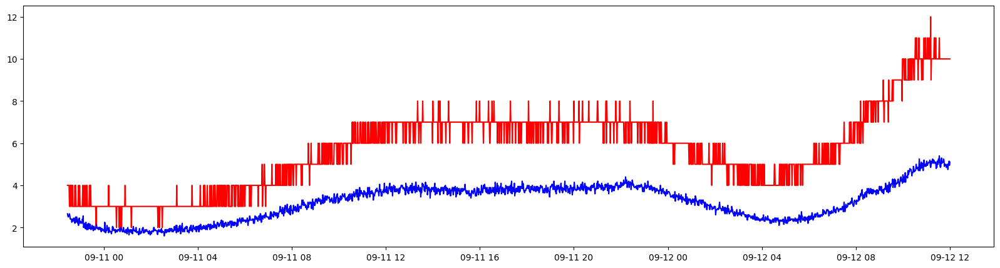

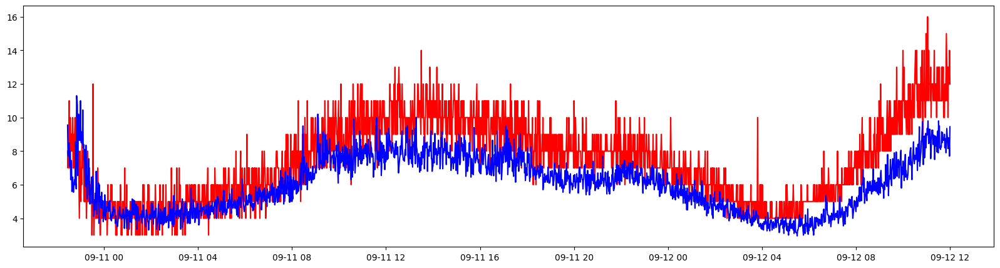

In [84]:
a5 = reduce(lambda x,y: pd.merge(x,y, on='created_at', how='inner'), [aero, BN5])
a5 = a5.dropna()
a5 = a5[a5['PM2.5'] <= 999]
x = a5['created_at']
s1 = a5['PM2.5_ppb']
s2 = a5['PM2.5']
fig = plt.figure(figsize=(20,5))
plt.plot(x,s1,'r')
plt.plot(x,s2,'b')

x = a5['created_at']
s3 = a5['PM10_ppb']
s4 = a5['PM10']
fig = plt.figure(figsize=(20,5))
plt.plot(x,s3,'r')
plt.plot(x,s4,'b')

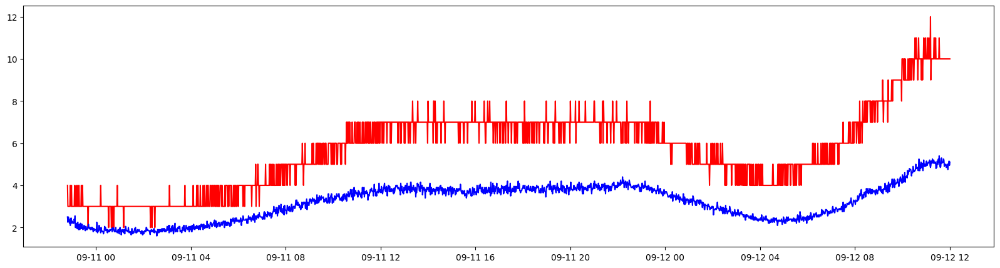

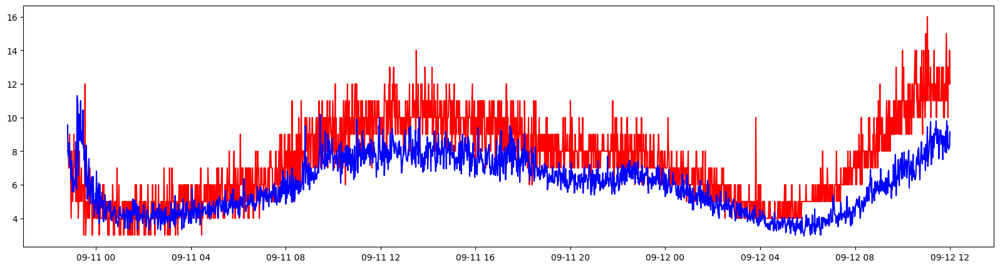

In [85]:
a5['PM2.5_shift'] = a5['PM2.5'].shift(0)
a5['PM10_shift'] = a5['PM10'].shift(21)

a5 = a5.dropna()
x = a5['created_at']
s_1 = a5['PM2.5_ppb']
s_2 = a5['PM2.5_shift']
fig = plt.figure(figsize=(20,5))
plt.plot(x,s_1,'r')
plt.plot(x,s_2,'b')

x = a5['created_at']
s_3 = a5['PM10_ppb']
s_4 = a5['PM10_shift']
fig = plt.figure(figsize=(20,5))
plt.plot(x,s_3,'r')
plt.plot(x,s_4,'b')

In [86]:
npts = len(a5)
lags = np.arange(-npts + 1, npts)
lag.append(lags)
ccov = np.correlate(s_1 - s_1.mean(), s_2 - s_2.mean(), mode='full')
ccor = ccov / (npts * s_1.std() * s_2.std())
correlation.append(ccor)
maxlag = lags[np.argmax(ccor)]
#print('*************',Node[i],'***************')
print("max correlation is at lag %d" % maxlag)
print("max correlation is ", round(max(ccor),3))
corr, _ = pearsonr(s_2, s_1)
print('Pearsons correlation: %.3f' % corr)
MSE = mean_squared_error(s_2, s_1)
MAE = mean_absolute_error(s_2, s_1)
print("MSE PM2.5: ", MSE)
print("MAE PM2.5: ", MAE)
print("RMSE PM2.5: ", np.sqrt(mean_squared_error(s_2, s_1)))

npts = len(a5)
lags = np.arange(-npts + 1, npts)
lag.append(lags)
ccov = np.correlate(s_3 - s_3.mean(), s_4 - s_4.mean(), mode='full')
ccor = ccov / (npts * s_3.std() * s_4.std())
correlation.append(ccor)
maxlag = lags[np.argmax(ccor)]
#print('*************',Node[i],'***************')
print("max correlation is at lag %d" % maxlag)
print("max correlation is ", round(max(ccor),3))
corr, _ = pearsonr(s_4, s_3)
print('Pearsons correlation: %.3f' % corr)
MSE = mean_squared_error(s_4, s_3)
MAE = mean_absolute_error(s_4, s_3)
print("MSE PM10: ", MSE)
print("MAE PM10: ", MAE)
print("RMSE PM10: ", np.sqrt(mean_squared_error(s_4, s_3)))

max correlation is at lag 0
max correlation is  0.941
Pearsons correlation: 0.941
MSE PM2.5:  7.657411950201884
MAE PM2.5:  2.535942126514132
RMSE PM2.5:  2.767202910919596
max correlation is at lag -42
max correlation is  0.792
Pearsons correlation: 0.771
MSE PM10:  4.3993696590399285
MAE PM10:  1.676768954688201
RMSE PM10:  2.097467439327707


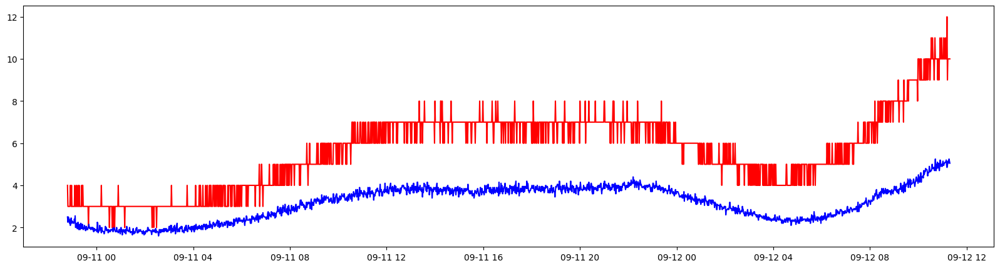

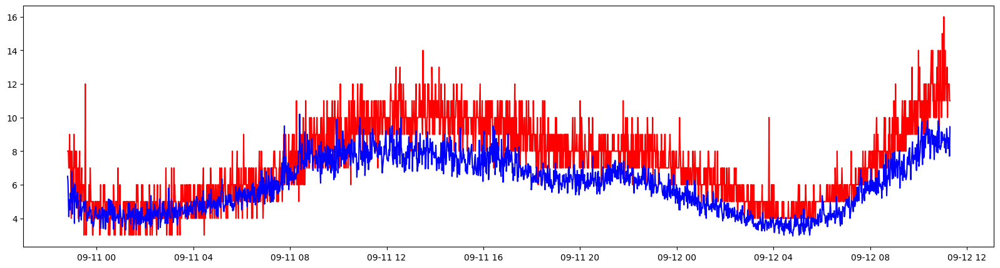

In [87]:
a5['PM2.5_shift'] = a5['PM2.5'].shift(0)
a5['PM10_shift'] = a5['PM10'].shift(-42)

a5 = a5.dropna()
x = a5['created_at']
s_1 = a5['PM2.5_ppb']
s_2 = a5['PM2.5_shift']
fig = plt.figure(figsize=(20,5))
plt.plot(x,s_1,'r')
plt.plot(x,s_2,'b')

x = a5['created_at']
s_3 = a5['PM10_ppb']
s_4 = a5['PM10_shift']
fig = plt.figure(figsize=(20,5))
plt.plot(x,s_3,'r')
plt.plot(x,s_4,'b')

In [88]:
npts = len(a5)
lags = np.arange(-npts + 1, npts)
lag.append(lags)
ccov = np.correlate(s_1 - s_1.mean(), s_2 - s_2.mean(), mode='full')
ccor = ccov / (npts * s_1.std() * s_2.std())
correlation.append(ccor)
maxlag = lags[np.argmax(ccor)]
#print('*************',Node[i],'***************')
print("max correlation is at lag %d" % maxlag)
print("max correlation is ", round(max(ccor),3))
corr, _ = pearsonr(s_2, s_1)
print('Pearsons correlation: %.3f' % corr)
MSE = mean_squared_error(s_2, s_1)
MAE = mean_absolute_error(s_2, s_1)
print("MSE PM2.5: ", MSE)
print("MAE PM2.5: ", MAE)
print("RMSE PM2.5: ", np.sqrt(mean_squared_error(s_2, s_1)))

npts = len(a5)
lags = np.arange(-npts + 1, npts)
lag.append(lags)
ccov = np.correlate(s_3 - s_3.mean(), s_4 - s_4.mean(), mode='full')
ccor = ccov / (npts * s_3.std() * s_4.std())
correlation.append(ccor)
maxlag = lags[np.argmax(ccor)]
#print('*************',Node[i],'***************')
print("max correlation is at lag %d" % maxlag)
print("max correlation is ", round(max(ccor),3))
corr, _ = pearsonr(s_4, s_3)
print('Pearsons correlation: %.3f' % corr)
MSE = mean_squared_error(s_4, s_3)
MAE = mean_absolute_error(s_4, s_3)
print("MSE PM10: ", MSE)
print("MAE PM10: ", MAE)
print("RMSE PM10: ", np.sqrt(mean_squared_error(s_4, s_3)))

max correlation is at lag 0
max correlation is  0.935
Pearsons correlation: 0.936
MSE PM2.5:  7.313155572473708
MAE PM2.5:  2.4876611796982164
RMSE PM2.5:  2.704284669274614
max correlation is at lag 21
max correlation is  0.831
Pearsons correlation: 0.824
MSE PM10:  3.6659807818930044
MAE PM10:  1.5350178326474622
RMSE PM10:  1.9146751113160176


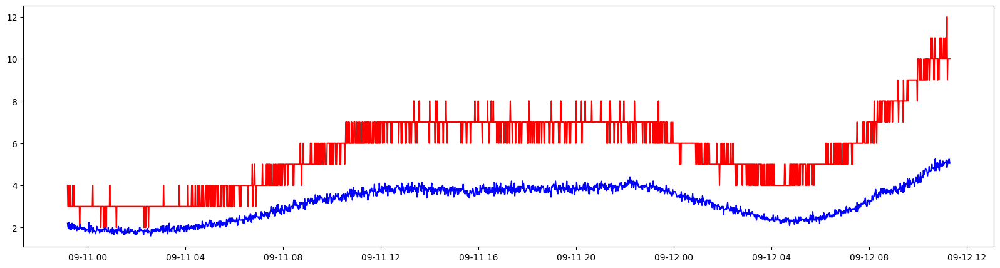

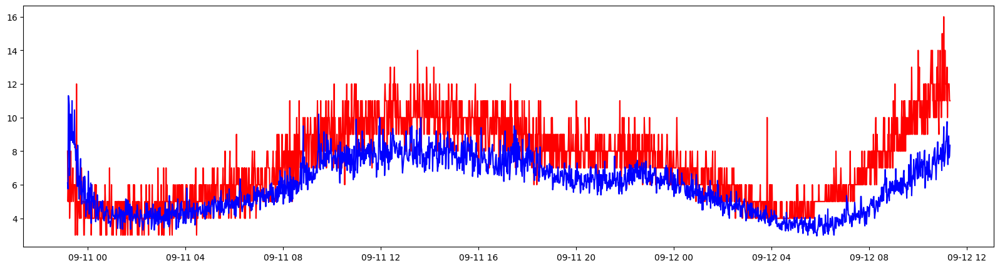

In [89]:
a5['PM2.5_shift'] = a5['PM2.5'].shift(0)
a5['PM10_shift'] = a5['PM10'].shift(21)

a5 = a5.dropna()
x = a5['created_at']
s_1 = a5['PM2.5_ppb']
s_2 = a5['PM2.5_shift']
fig = plt.figure(figsize=(20,5))
plt.plot(x,s_1,'r')
plt.plot(x,s_2,'b')

x = a5['created_at']
s_3 = a5['PM10_ppb']
s_4 = a5['PM10_shift']
fig = plt.figure(figsize=(20,5))
plt.plot(x,s_3,'r')
plt.plot(x,s_4,'b')

In [90]:
npts = len(a5)
lags = np.arange(-npts + 1, npts)
lag.append(lags)
ccov = np.correlate(s_1 - s_1.mean(), s_2 - s_2.mean(), mode='full')
ccor = ccov / (npts * s_1.std() * s_2.std())
correlation.append(ccor)
maxlag = lags[np.argmax(ccor)]
#print('*************',Node[i],'***************')
print("max correlation is at lag %d" % maxlag)
print("max correlation is ", round(max(ccor),3))
corr, _ = pearsonr(s_2, s_1)
print('Pearsons correlation: %.3f' % corr)
MSE = mean_squared_error(s_2, s_1)
MAE = mean_absolute_error(s_2, s_1)
print("MSE PM2.5: ", MSE)
print("MAE PM2.5: ", MAE)
print("RMSE PM2.5: ", np.sqrt(mean_squared_error(s_2, s_1)))

npts = len(a5)
lags = np.arange(-npts + 1, npts)
lag.append(lags)
ccov = np.correlate(s_3 - s_3.mean(), s_4 - s_4.mean(), mode='full')
ccor = ccov / (npts * s_3.std() * s_4.std())
correlation.append(ccor)
maxlag = lags[np.argmax(ccor)]
#print('*************',Node[i],'***************')
print("max correlation is at lag %d" % maxlag)
print("max correlation is ", round(max(ccor),3))
corr, _ = pearsonr(s_4, s_3)
print('Pearsons correlation: %.3f' % corr)
MSE = mean_squared_error(s_4, s_3)
MAE = mean_absolute_error(s_4, s_3)
print("MSE PM10: ", MSE)
print("MAE PM10: ", MAE)
print("RMSE PM10: ", np.sqrt(mean_squared_error(s_4, s_3)))

max correlation is at lag 0
max correlation is  0.935
Pearsons correlation: 0.936
MSE PM2.5:  7.374603525854109
MAE PM2.5:  2.5031001846722067
RMSE PM2.5:  2.715622125011893
max correlation is at lag -42
max correlation is  0.787
Pearsons correlation: 0.765
MSE PM10:  4.269560235457063
MAE PM10:  1.6516934441366575
RMSE PM10:  2.0662914207480663


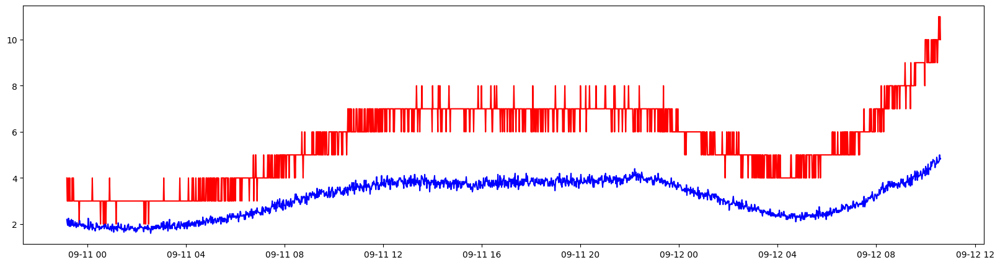

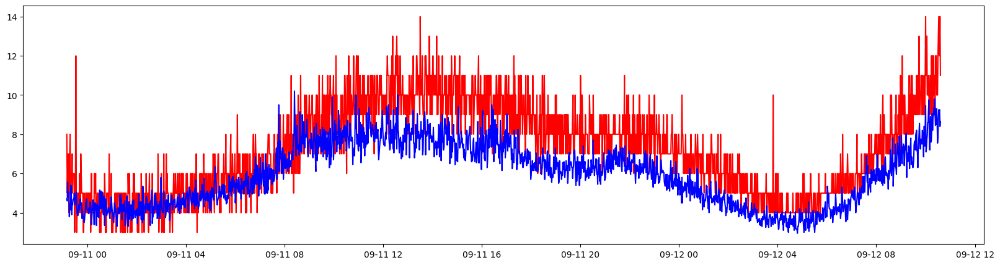

In [91]:
a5['PM2.5_shift'] = a5['PM2.5'].shift(0)
a5['PM10_shift'] = a5['PM10'].shift(-42)

a5 = a5.dropna()
x = a5['created_at']
s_1 = a5['PM2.5_ppb']
s_2 = a5['PM2.5_shift']
fig = plt.figure(figsize=(20,5))
plt.plot(x,s_1,'r')
plt.plot(x,s_2,'b')

x = a5['created_at']
s_3 = a5['PM10_ppb']
s_4 = a5['PM10_shift']
fig = plt.figure(figsize=(20,5))
plt.plot(x,s_3,'r')
plt.plot(x,s_4,'b')

In [92]:
npts = len(a5)
lags = np.arange(-npts + 1, npts)
lag.append(lags)
ccov = np.correlate(s_1 - s_1.mean(), s_2 - s_2.mean(), mode='full')
ccor = ccov / (npts * s_1.std() * s_2.std())
correlation.append(ccor)
maxlag = lags[np.argmax(ccor)]
#print('*************',Node[i],'***************')
print("max correlation is at lag %d" % maxlag)
print("max correlation is ", round(max(ccor),3))
corr, _ = pearsonr(s_2, s_1)
print('Pearsons correlation: %.3f' % corr)
MSE = mean_squared_error(s_2, s_1)
MAE = mean_absolute_error(s_2, s_1)
print("MSE PM2.5: ", MSE)
print("MAE PM2.5: ", MAE)
print("RMSE PM2.5: ", np.sqrt(mean_squared_error(s_2, s_1)))

npts = len(a5)
lags = np.arange(-npts + 1, npts)
lag.append(lags)
ccov = np.correlate(s_3 - s_3.mean(), s_4 - s_4.mean(), mode='full')
ccor = ccov / (npts * s_3.std() * s_4.std())
correlation.append(ccor)
maxlag = lags[np.argmax(ccor)]
#print('*************',Node[i],'***************')
print("max correlation is at lag %d" % maxlag)
print("max correlation is ", round(max(ccor),3))
corr, _ = pearsonr(s_4, s_3)
print('Pearsons correlation: %.3f' % corr)
MSE = mean_squared_error(s_4, s_3)
MAE = mean_absolute_error(s_4, s_3)
print("MSE PM10: ", MSE)
print("MAE PM10: ", MAE)
print("RMSE PM10: ", np.sqrt(mean_squared_error(s_4, s_3)))

max correlation is at lag 0
max correlation is  0.929
Pearsons correlation: 0.930
MSE PM2.5:  7.001223510828625
MAE PM2.5:  2.4518667608286253
RMSE PM2.5:  2.645982522774598
max correlation is at lag 2
max correlation is  0.825
Pearsons correlation: 0.819
MSE PM10:  3.5030249387947268
MAE PM10:  1.5010753295668549
RMSE PM10:  1.8716369676822284


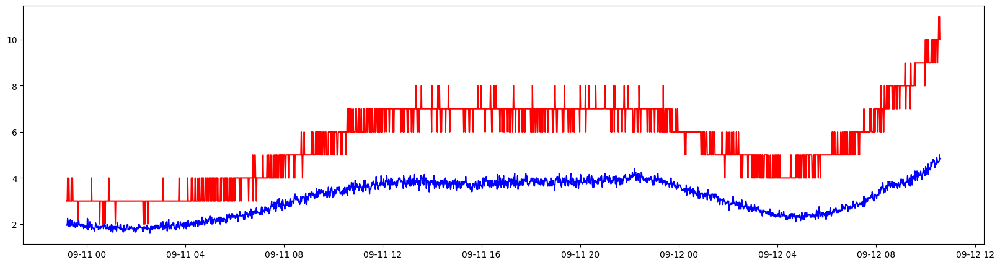

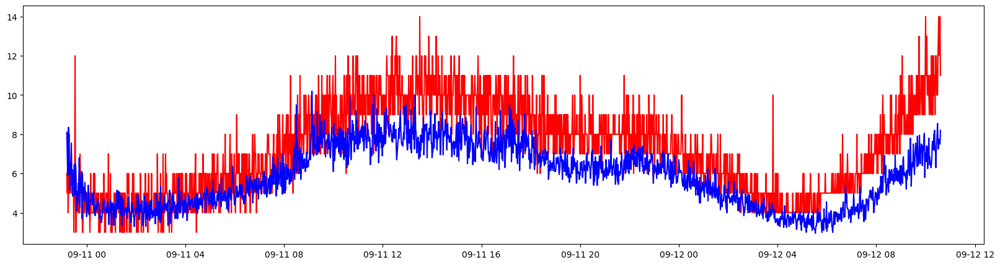

In [93]:
a5['PM2.5_shift'] = a5['PM2.5'].shift(0)
a5['PM10_shift'] = a5['PM10'].shift(2)

a5 = a5.dropna()
x = a5['created_at']
s_1 = a5['PM2.5_ppb']
s_2 = a5['PM2.5_shift']
fig = plt.figure(figsize=(20,5))
plt.plot(x,s_1,'r')
plt.plot(x,s_2,'b')

x = a5['created_at']
s_3 = a5['PM10_ppb']
s_4 = a5['PM10_shift']
fig = plt.figure(figsize=(20,5))
plt.plot(x,s_3,'r')
plt.plot(x,s_4,'b')

In [94]:
npts = len(a5)
lags = np.arange(-npts + 1, npts)
lag.append(lags)
ccov = np.correlate(s_1 - s_1.mean(), s_2 - s_2.mean(), mode='full')
ccor = ccov / (npts * s_1.std() * s_2.std())
correlation.append(ccor)
maxlag = lags[np.argmax(ccor)]
#print('*************',Node[i],'***************')
print("max correlation is at lag %d" % maxlag)
print("max correlation is ", round(max(ccor),3))
corr, _ = pearsonr(s_2, s_1)
print('Pearsons correlation: %.3f' % corr)
MSE = mean_squared_error(s_2, s_1)
MAE = mean_absolute_error(s_2, s_1)
print("MSE PM2.5: ", MSE)
print("MAE PM2.5: ", MAE)
print("RMSE PM2.5: ", np.sqrt(mean_squared_error(s_2, s_1)))

npts = len(a5)
lags = np.arange(-npts + 1, npts)
lag.append(lags)
ccov = np.correlate(s_3 - s_3.mean(), s_4 - s_4.mean(), mode='full')
ccor = ccov / (npts * s_3.std() * s_4.std())
correlation.append(ccor)
maxlag = lags[np.argmax(ccor)]
#print('*************',Node[i],'***************')
print("max correlation is at lag %d" % maxlag)
print("max correlation is ", round(max(ccor),3))
corr, _ = pearsonr(s_4, s_3)
print('Pearsons correlation: %.3f' % corr)
MSE = mean_squared_error(s_4, s_3)
MAE = mean_absolute_error(s_4, s_3)
print("MSE PM10: ", MSE)
print("MAE PM10: ", MAE)
print("RMSE PM10: ", np.sqrt(mean_squared_error(s_4, s_3)))

max correlation is at lag 0
max correlation is  0.929
Pearsons correlation: 0.929
MSE PM2.5:  7.0058700457115926
MAE PM2.5:  2.452881715362865
RMSE PM2.5:  2.6468604129631754
max correlation is at lag -23
max correlation is  0.82
Pearsons correlation: 0.813
MSE PM10:  3.7218861781338357
MAE PM10:  1.5486493873704055
RMSE PM10:  1.929219059136063


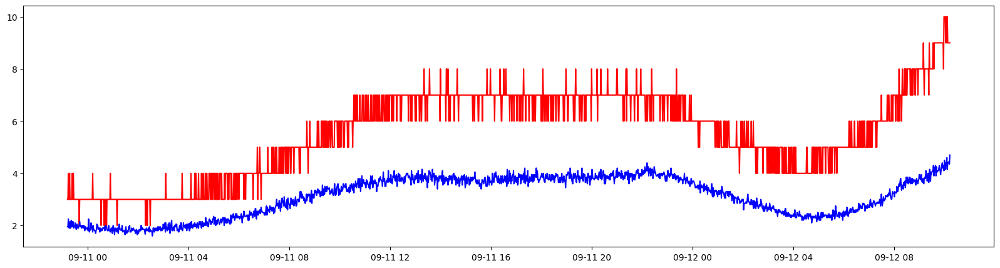

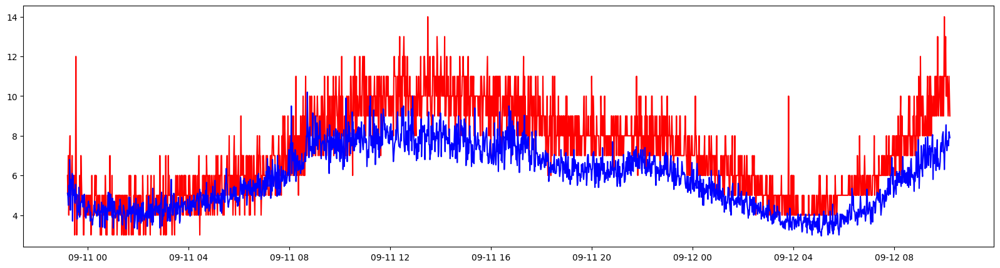

In [95]:
a5['PM2.5_shift'] = a5['PM2.5'].shift(0)
a5['PM10_shift'] = a5['PM10'].shift(-23)

a5 = a5.dropna()
x = a5['created_at']
s_1 = a5['PM2.5_ppb']
s_2 = a5['PM2.5_shift']
fig = plt.figure(figsize=(20,5))
plt.plot(x,s_1,'r')
plt.plot(x,s_2,'b')

x = a5['created_at']
s_3 = a5['PM10_ppb']
s_4 = a5['PM10_shift']
fig = plt.figure(figsize=(20,5))
plt.plot(x,s_3,'r')
plt.plot(x,s_4,'b')

In [96]:
npts = len(a5)
lags = np.arange(-npts + 1, npts)
lag.append(lags)
ccov = np.correlate(s_1 - s_1.mean(), s_2 - s_2.mean(), mode='full')
ccor = ccov / (npts * s_1.std() * s_2.std())
correlation.append(ccor)
maxlag = lags[np.argmax(ccor)]
#print('*************',Node[i],'***************')
print("max correlation is at lag %d" % maxlag)
print("max correlation is ", round(max(ccor),3))
corr, _ = pearsonr(s_2, s_1)
print('Pearsons correlation: %.3f' % corr)
MSE = mean_squared_error(s_2, s_1)
MAE = mean_absolute_error(s_2, s_1)
print("MSE PM2.5: ", MSE)
print("MAE PM2.5: ", MAE)
print("RMSE PM2.5: ", np.sqrt(mean_squared_error(s_2, s_1)))

npts = len(a5)
lags = np.arange(-npts + 1, npts)
lag.append(lags)
ccov = np.correlate(s_3 - s_3.mean(), s_4 - s_4.mean(), mode='full')
ccor = ccov / (npts * s_3.std() * s_4.std())
correlation.append(ccor)
maxlag = lags[np.argmax(ccor)]
#print('*************',Node[i],'***************')
print("max correlation is at lag %d" % maxlag)
print("max correlation is ", round(max(ccor),3))
corr, _ = pearsonr(s_4, s_3)
print('Pearsons correlation: %.3f' % corr)
MSE = mean_squared_error(s_4, s_3)
MAE = mean_absolute_error(s_4, s_3)
print("MSE PM10: ", MSE)
print("MAE PM10: ", MAE)
print("RMSE PM10: ", np.sqrt(mean_squared_error(s_4, s_3)))

max correlation is at lag 0
max correlation is  0.927
Pearsons correlation: 0.927
MSE PM2.5:  6.796169002858504
MAE PM2.5:  2.4240900428775607
RMSE PM2.5:  2.606946298422448
max correlation is at lag 2
max correlation is  0.837
Pearsons correlation: 0.829
MSE PM10:  3.427108370652692
MAE PM10:  1.495665555026203
RMSE PM10:  1.851245086597853


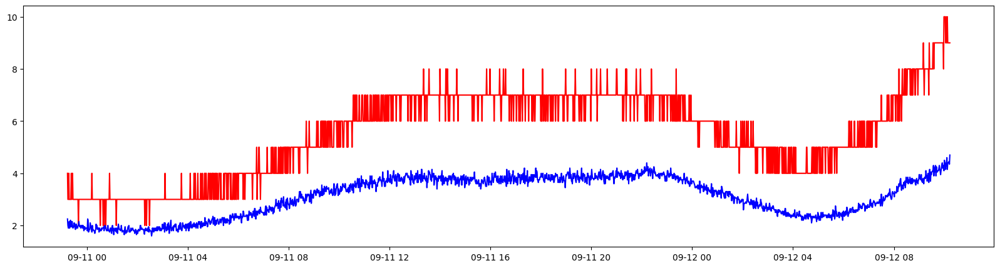

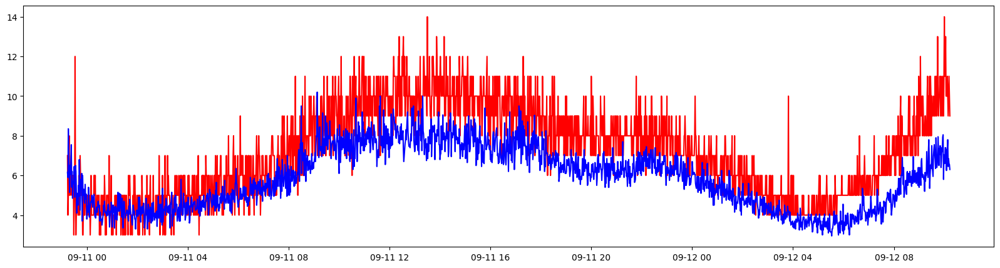

In [97]:
a5['PM2.5_shift'] = a5['PM2.5'].shift(0)
a5['PM10_shift'] = a5['PM10'].shift(2)

a5 = a5.dropna()
x = a5['created_at']
s_1 = a5['PM2.5_ppb']
s_2 = a5['PM2.5_shift']
fig = plt.figure(figsize=(20,5))
plt.plot(x,s_1,'r')
plt.plot(x,s_2,'b')

x = a5['created_at']
s_3 = a5['PM10_ppb']
s_4 = a5['PM10_shift']
fig = plt.figure(figsize=(20,5))
plt.plot(x,s_3,'r')
plt.plot(x,s_4,'b')

In [98]:
npts = len(a5)
lags = np.arange(-npts + 1, npts)
lag.append(lags)
ccov = np.correlate(s_1 - s_1.mean(), s_2 - s_2.mean(), mode='full')
ccor = ccov / (npts * s_1.std() * s_2.std())
correlation.append(ccor)
maxlag = lags[np.argmax(ccor)]
#print('*************',Node[i],'***************')
print("max correlation is at lag %d" % maxlag)
print("max correlation is ", round(max(ccor),3))
corr, _ = pearsonr(s_2, s_1)
print('Pearsons correlation: %.3f' % corr)
MSE = mean_squared_error(s_2, s_1)
MAE = mean_absolute_error(s_2, s_1)
print("MSE PM2.5: ", MSE)
print("MAE PM2.5: ", MAE)
print("RMSE PM2.5: ", np.sqrt(mean_squared_error(s_2, s_1)))

npts = len(a5)
lags = np.arange(-npts + 1, npts)
lag.append(lags)
ccov = np.correlate(s_3 - s_3.mean(), s_4 - s_4.mean(), mode='full')
ccor = ccov / (npts * s_3.std() * s_4.std())
correlation.append(ccor)
maxlag = lags[np.argmax(ccor)]
#print('*************',Node[i],'***************')
print("max correlation is at lag %d" % maxlag)
print("max correlation is ", round(max(ccor),3))
corr, _ = pearsonr(s_4, s_3)
print('Pearsons correlation: %.3f' % corr)
MSE = mean_squared_error(s_4, s_3)
MAE = mean_absolute_error(s_4, s_3)
print("MSE PM10: ", MSE)
print("MAE PM10: ", MAE)
print("RMSE PM10: ", np.sqrt(mean_squared_error(s_4, s_3)))

max correlation is at lag 0
max correlation is  0.927
Pearsons correlation: 0.927
MSE PM2.5:  6.801599302336672
MAE PM2.5:  2.4254005722460654
RMSE PM2.5:  2.607987596277381
max correlation is at lag -23
max correlation is  0.826
Pearsons correlation: 0.815
MSE PM10:  3.579724592274678
MAE PM10:  1.5245274201239865
RMSE PM10:  1.892016012689818


# Plotting Calibrated data

In [104]:
import plotly.express as px
import pandas as pd

# Define function to calculate modified values
def calculate_values(df, m_pm25, c_pm25, m_pm10, c_pm10):
    df['PM2.5_c'] = df['PM2.5'] * m_pm25 + c_pm25
    df['PM10_c'] = df['PM10'] * m_pm10 + c_pm10
    return df

# Define coefficients for each file
coefficients = {


    'bn_1_without_outliers': {'m_pm25': 1.11334987, 'c_pm25': -0.16948178787182844 , 'm_pm10': 0.97002475, 'c_pm10': -2.3727663609688294},
    'bn_2_without_outliers': {'m_pm25': 0.93015168, 'c_pm25': -0.040799815007715345, 'm_pm10': 0.87706109, 'c_pm10': -2.1356714899294023},
    'bn_3_without_outliers': {'m_pm25': 0.89863004, 'c_pm25': -0.32065264857330433, 'm_pm10': 0.81439719, 'c_pm10': -1.303864500895843},
    'bn_4_without_outliers': {'m_pm25': 1.12158869, 'c_pm25': -0.2661447297301702, 'm_pm10': 0.95961697, 'c_pm10': -1.9232146517229545},
    'bn_5_without_outliers': {'m_pm25': 2.04935917, 'c_pm25': -0.8083273799306223, 'm_pm10': 1.23317977, 'c_pm10': -0.0247018968261008}
}

# Applying coefficients for each file and saving calibrated data
filepaths = ['/content/bn_1_without_outliers.csv', '/content/bn_2_without_outliers.csv', '/content/bn_3_without_outliers.csv', '/content/bn_4_without_outliers.csv', '/content/bn_5_without_outliers.csv']

for filepath in filepaths:
    name_without_extension = filepath.split('/')[-1].split('.')[0]

    # Load data
    hourly_data = pd.read_csv(filepath, parse_dates=['created_at'])

    # Extract coefficients
    if name_without_extension in coefficients:
        coeff = coefficients[name_without_extension]
        m_pm25, c_pm25, m_pm10, c_pm10 = coeff['m_pm25'], coeff['c_pm25'], coeff['m_pm10'], coeff['c_pm10']
    else:
        raise ValueError(f"Unknown file: {name_without_extension}")

    # Calculate modified data
    hourly_data_modified = calculate_values(hourly_data, m_pm25, c_pm25, m_pm10, c_pm10)

    # Save calibrated data to CSV
    calibrated_filename = f'{name_without_extension}_calibrated_hourly.csv'
    hourly_data_modified.to_csv(calibrated_filename, index=False)
    print(f"Calibrated data for {name_without_extension} saved as {calibrated_filename}")

    # Plotting modified data
    fig = px.line(hourly_data_modified, x='created_at',
                  y=['PM2.5_c', 'PM10_c'],
                  title=f'Hourly Averages with Coefficients - {name_without_extension}')

    # Add range slider
    fig.update_layout(xaxis=dict(
        tickformat='%d %b',
        tickmode='linear',
        tick0=hourly_data_modified['created_at'].iloc[0],
        dtick='12H',
        tickangle=0,
        rangeselector=dict(
            buttons=list([
                dict(count=1, label="1d", step="day", stepmode="backward"),
                dict(count=7, label="1w", step="day", stepmode="backward"),
                dict(count=1, label="1m", step="month", stepmode="backward"),
                # dict(count=1, label="1y", step="year", stepmode="backward"),
                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        )
    ))

    # Increase the width of the plot
    fig.update_layout(width=1000)  # Adjust the width as needed

    fig.show()

    # Save plot as HTML
    fig.write_html(f"{name_without_extension}_calibrated_hourly_plot.html")


Calibrated data for bn_1_without_outliers saved as bn_1_without_outliers_calibrated_hourly.csv


/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



Calibrated data for bn_2_without_outliers saved as bn_2_without_outliers_calibrated_hourly.csv


/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



Calibrated data for bn_3_without_outliers saved as bn_3_without_outliers_calibrated_hourly.csv


/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



Calibrated data for bn_4_without_outliers saved as bn_4_without_outliers_calibrated_hourly.csv


/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



Calibrated data for bn_5_without_outliers saved as bn_5_without_outliers_calibrated_hourly.csv


/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



In [105]:
import plotly.express as px
import pandas as pd

# Dictionary to store HTML plots
html_plots = {}

# List to store filenames for HTML plots
html_filenames = []

# Define function to calculate modified values
def calculate_values(df, m_pm25, c_pm25, m_pm10, c_pm10):
    df['PM2.5_c'] = df['PM2.5'] * m_pm25 + c_pm25
    df['PM10_c'] = df['PM10'] * m_pm10 + c_pm10
    return df

# Loop through parameters
for parameter in ['PM2.5_c', 'PM10_c']:
    fig = px.line(title=f'{parameter} Data')

    # Loop through uploaded files
    for filepath in filepaths:
        name_without_extension = filepath.split('/')[-1].split('.')[0]

        # Extract coefficients
        if name_without_extension in coefficients:
            coeff = coefficients[name_without_extension]
            m_pm25, c_pm25, m_pm10, c_pm10 = coeff['m_pm25'], coeff['c_pm25'], coeff['m_pm10'], coeff['c_pm10']
        else:
            raise ValueError(f"Unknown file: {name_without_extension}")

        # Load data
        hourly_data = pd.read_csv(filepath, parse_dates=['created_at'])

        # Calculate modified data
        hourly_data_modified = calculate_values(hourly_data, m_pm25, c_pm25, m_pm10, c_pm10)

        # Add trace to the plot using modified columns
        fig.add_scatter(x=hourly_data_modified['created_at'], y=hourly_data_modified[parameter],
                        mode='lines', name=name_without_extension)

    # Update layout
    fig.update_layout(xaxis_title='Time', yaxis_title=parameter, width=1000,
                      xaxis=dict(
                          tickformat='%d %b',
                          tickmode='linear',
                          tick0=hourly_data_modified['created_at'].iloc[0],
                          dtick='12H',
                          tickangle=0,
                          rangeselector=dict(
                              buttons=list([
                                  dict(count=1, label="1d", step="day", stepmode="backward"),
                                  dict(count=7, label="1w", step="day", stepmode="backward"),
                                  dict(count=1, label="1m", step="month", stepmode="backward"),
                                  # dict(count=1, label="1y", step="year", stepmode="backward"),
                                  dict(step="all")
                              ])
                          ),
                          rangeslider=dict(
                              visible=True
                          )
                      )
                      )

    fig.show()

    # Save plot as HTML
    html_content = fig.to_html(full_html=False, include_plotlyjs='cdn')
    html_plots[parameter] = html_content

    html_filename = f"{parameter}_data_plot.html"
    with open(html_filename, 'w') as f:
        f.write(html_content)
    html_filenames.append(html_filename)

# Display HTML filenames
print("HTML plots saved as:")
for filename in html_filenames:
    print(filename)


/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

/usr/local/lib/python3.10/dist-packages/

/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

/usr/local/lib/python3.10/dist-packages/

HTML plots saved as:
PM2.5_c_data_plot.html
PM10_c_data_plot.html


# Plotting Aero + Nodes Calibrated data

In [106]:
import plotly.express as px
import pandas as pd

# Load the calibrated data for the outdoor nodes
n1 = pd.read_csv('/content/bn_1_without_outliers_calibrated_hourly.csv', parse_dates=['created_at'])
n2 = pd.read_csv('/content/bn_2_without_outliers_calibrated_hourly.csv', parse_dates=['created_at'])
n3 = pd.read_csv('/content/bn_3_without_outliers_calibrated_hourly.csv', parse_dates=['created_at'])
n4 = pd.read_csv('/content/bn_4_without_outliers_calibrated_hourly.csv', parse_dates=['created_at'])
n5 = pd.read_csv('/content/bn_5_without_outliers_calibrated_hourly.csv', parse_dates=['created_at'])

# Load the modified Aero data
aero = pd.read_csv('/content/modified_aero.csv', parse_dates=['created_at'])

# Create a figure for PM2.5
fig_pm25 = px.line(title='Outdoor Nodes - PM2.5')
fig_pm25.add_scatter(x=n1['created_at'], y=n1['PM2.5_c'], name='SDS_1')
fig_pm25.add_scatter(x=n2['created_at'], y=n2['PM2.5_c'], name='SDS_2')
fig_pm25.add_scatter(x=n3['created_at'], y=n3['PM2.5_c'], name='SDS_3')
fig_pm25.add_scatter(x=n4['created_at'], y=n4['PM2.5_c'], name='SDS_4')
fig_pm25.add_scatter(x=n5['created_at'], y=n5['PM2.5_c'], name='SDS_5')
fig_pm25.add_scatter(x=aero['created_at'], y=aero['PM2.5_ppb'], name='Aero')
fig_pm25.show()

# Create a figure for PM10
fig_pm10 = px.line(title='Outdoor Nodes - PM10')
fig_pm10.add_scatter(x=n1['created_at'], y=n1['PM10_c'], name='SDS_1')
fig_pm10.add_scatter(x=n2['created_at'], y=n2['PM10_c'], name='SDS_2')
fig_pm10.add_scatter(x=n3['created_at'], y=n3['PM10_c'], name='SDS_3')
fig_pm10.add_scatter(x=n4['created_at'], y=n4['PM10_c'], name='SDS_4')
fig_pm10.add_scatter(x=n5['created_at'], y=n5['PM10_c'], name='SDS_5')
fig_pm10.add_scatter(x=aero['created_at'], y=aero['PM10_ppb'], name='Aero')
fig_pm10.show()


/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



In [107]:

fig_1 = go.Figure()
fig_1.add_trace(go.Scatter(x=bn1['created_at'], y=bn1['PM2.5'], name='n1'))
fig_1.add_scatter(x=n1['created_at'], y=n1['PM2.5_c'], name='n1_c')
fig_1.add_scatter(x=aero['created_at'], y=aero['PM2.5_ppb'], name='Aero')

fig_1.update_layout(title='1 Raw vs Calibrated data PM2.5')
fig_1.update_xaxes()
fig_1.show()






